In [1]:
import numpy as np
import matplotlib.pyplot as plt

# g band

In [2]:
tid_g=np.load('tid_g.npy')
k_g=np.load('k_g.npy')
index_g=np.load('index_g.npy')
abs_mag_g=np.load('/global/u1/z/zhaozhon/task/abs_mag_g.npy')
magerr_g_1=np.load('/global/u1/z/zhaozhon/task/magerr_g_1.npy')
z_g = np.load('/global/u1/z/zhaozhon/task/z_g.npy')
apr_mag_g=np.load('/global/u1/z/zhaozhon/task/apr_mag_g.npy')

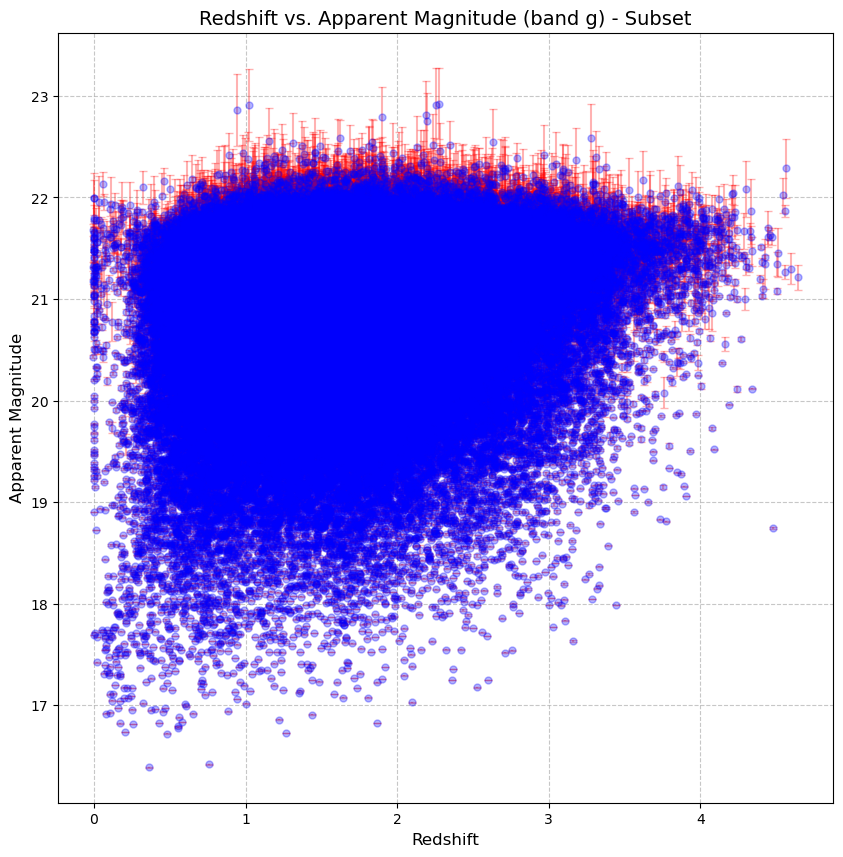

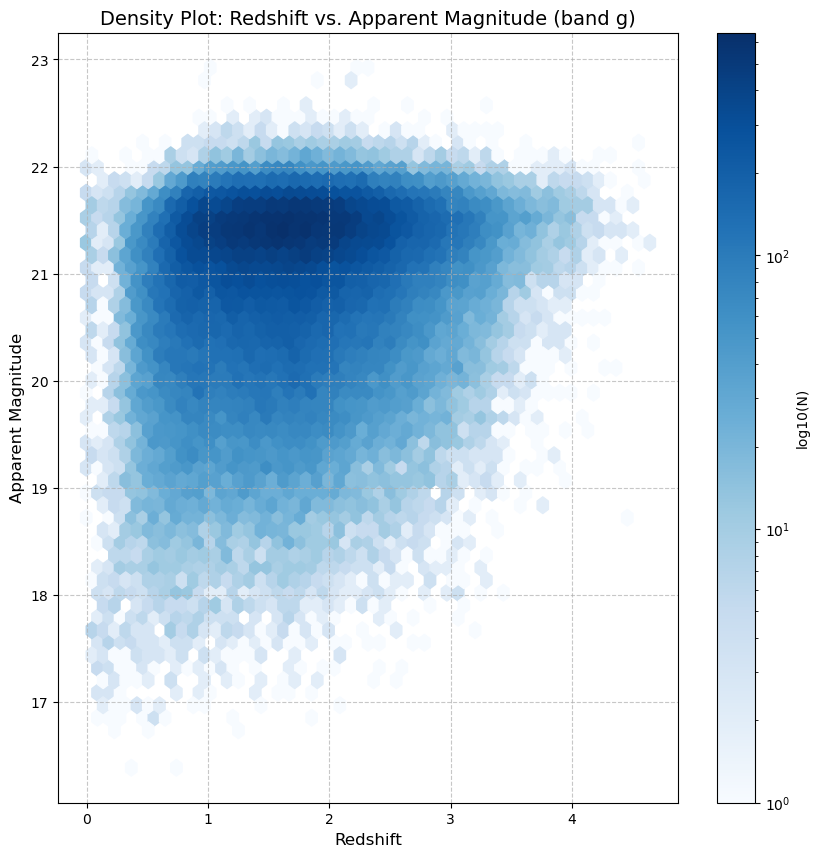

In [3]:
# Re-running the provided code with adjustments and saving the plots

# Filtering the data
# Creating and saving the errorbar plot
plt.figure(figsize=(10, 10))
plt.errorbar(z_g, apr_mag_g, yerr=magerr_g_1, fmt='o', color='blue', ecolor='red', capsize=3, markersize=5, alpha=0.3)
plt.title('Redshift vs. Apparent Magnitude (band g) - Subset', fontsize=14)
plt.xlabel('Redshift', fontsize=12)
plt.ylabel('Apparent Magnitude', fontsize=12)
plt.grid(True, linestyle='--', alpha=0.7)
plt.savefig('/global/u1/z/zhaozhon/k-correction/plot/apr_mag', dpi=300)  # Saving the errorbar plot

# Creating and saving the hexbin plot
plt.figure(figsize=(10, 10))
plt.hexbin(z_g, apr_mag_g, gridsize=50, cmap='Blues', bins='log')
plt.colorbar(label='log10(N)')
plt.title('Density Plot: Redshift vs. Apparent Magnitude (band g)', fontsize=14)
plt.xlabel('Redshift', fontsize=12)
plt.ylabel('Apparent Magnitude', fontsize=12)
plt.grid(True, linestyle='--', alpha=0.7)
plt.savefig('/global/u1/z/zhaozhon/k-correction/plot/apr_mag_density', dpi=300)  # Saving the hexbin plot

plt.show()  # Displaying the plots

In [4]:
index_g2 = np.isnan(k_g) | np.isneginf(k_g)
print(np.max(k_g[~index_g2]))
print(np.min(k_g[~index_g2]))

-0.6831810858532186
-3.5613212494002173


In [5]:
filtered_abs_mag_g = abs_mag_g[index_g][~index_g2]
filtered_apr_mag_g = apr_mag_g[index_g][~index_g2]
filtered_magerr_g_1 = magerr_g_1[index_g][~index_g2]
filtered_z_g = z_g[index_g][~index_g2]
tid_g = tid_g[~index_g2]
k_g = k_g[~index_g2]

In [6]:
k_abs_mag_g = filtered_abs_mag_g - k_g

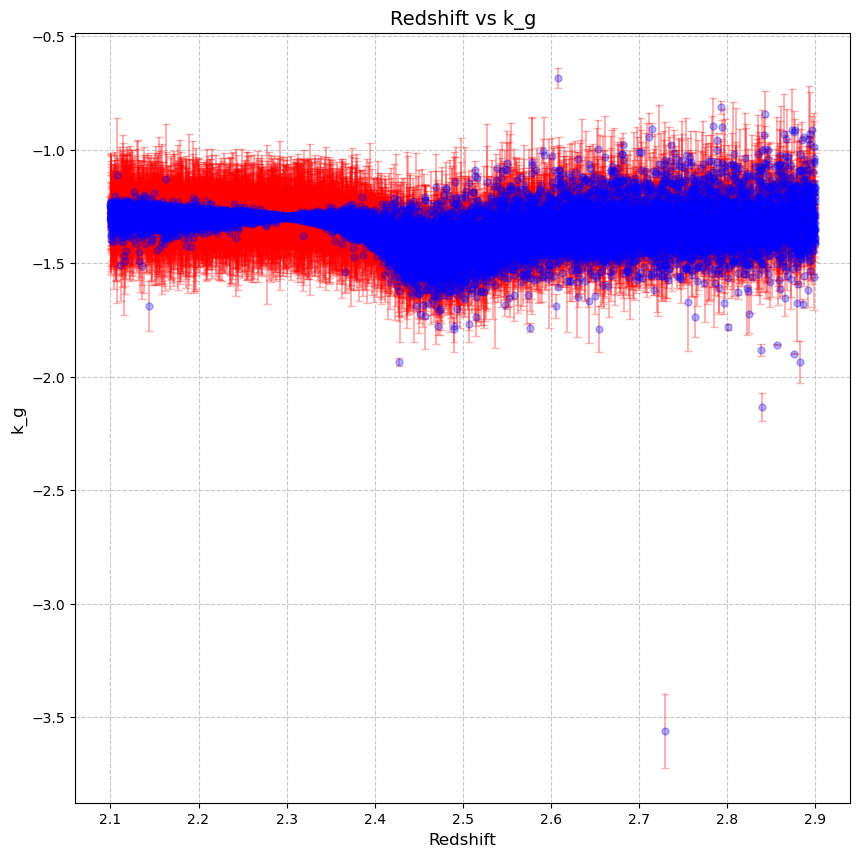

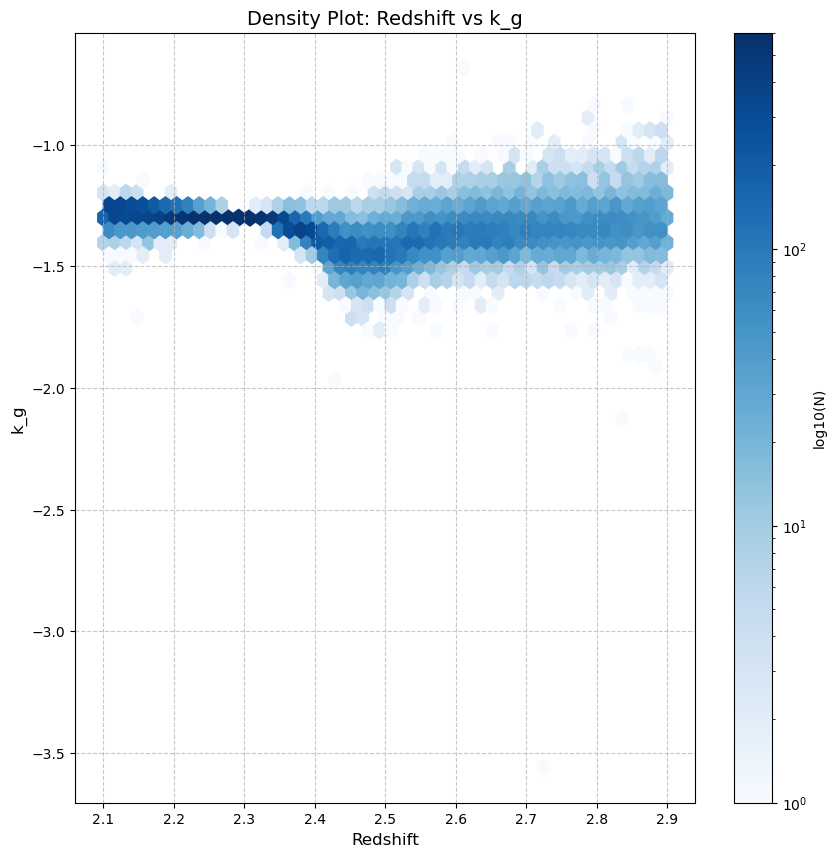

In [7]:
# Re-running the provided code with adjustments and saving the plots

# Filtering the data
# Creating and saving the errorbar plot
plt.figure(figsize=(10, 10))
plt.errorbar(filtered_z_g, k_g, yerr=filtered_magerr_g_1, fmt='o', color='blue', ecolor='red', capsize=3, markersize=5, alpha=0.3)
plt.title('Redshift vs k_g', fontsize=14)
plt.xlabel('Redshift', fontsize=12)
plt.ylabel('k_g', fontsize=12)
plt.grid(True, linestyle='--', alpha=0.7)
plt.savefig('/global/u1/z/zhaozhon/k-correction/plot/k_g1', dpi=300)  # Saving the errorbar plot

# Creating and saving the hexbin plot
plt.figure(figsize=(10, 10))
plt.hexbin(filtered_z_g, k_g, gridsize=50, cmap='Blues', bins='log')
plt.colorbar(label='log10(N)')
plt.title('Density Plot: Redshift vs k_g', fontsize=14)
plt.xlabel('Redshift', fontsize=12)
plt.ylabel('k_g', fontsize=12)
plt.grid(True, linestyle='--', alpha=0.7)
plt.savefig('/global/u1/z/zhaozhon/k-correction/plot/k_g2', dpi=300)  # Saving the hexbin plot

plt.show()  # Displaying the plots

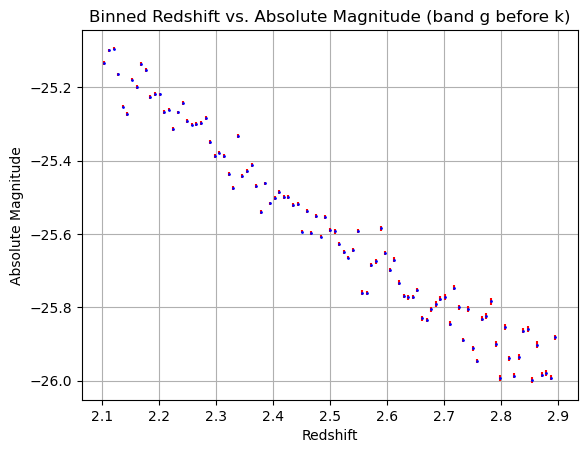

In [8]:
'''
plt.errorbar(filtered_z_g, filtered_abs_mag_g, yerr=filtered_magerr_g_1, fmt='o', color='b', ecolor='r', capsize=0,markersize=1)
plt.title('Redshift vs. Absolute Magnitude band g before k')
plt.xlabel('Redshift')
plt.ylabel('Absolute Magnitude')
plt.grid(True)
'''
bin_edges_g_bk = np.linspace(min(filtered_z_g), max(filtered_z_g), 100)  # Adjust the number of bins as needed
bin_centers_g_bk = 0.5 * (bin_edges_g_bk[:-1] + bin_edges_g_bk[1:])

# Bin the data
binned_magnitudes_g_bk = []
binned_errors_g_bk = []
for i in range(len(bin_edges_g_bk) - 1):
    # Select data points within the current bin
    in_bin = (filtered_z_g >= bin_edges_g_bk[i]) & (filtered_z_g < bin_edges_g_bk[i + 1])
    magnitudes = filtered_abs_mag_g[in_bin]
    errors = filtered_magerr_g_1[in_bin]

    # Calculate mean and standard error for the bin
    mean_magnitude = np.mean(magnitudes)
    stderr = np.sqrt(np.sum(errors**2)) / len(errors)

    binned_magnitudes_g_bk.append(mean_magnitude)
    binned_errors_g_bk.append(stderr)

# Plot
plt.errorbar(bin_centers_g_bk, binned_magnitudes_g_bk, yerr=binned_errors_g_bk, fmt='o', color='b', ecolor='r', capsize=0, markersize=1)
plt.title('Binned Redshift vs. Absolute Magnitude (band g before k)')
plt.xlabel('Redshift')
plt.ylabel('Absolute Magnitude')
plt.grid(True)
plt.show()

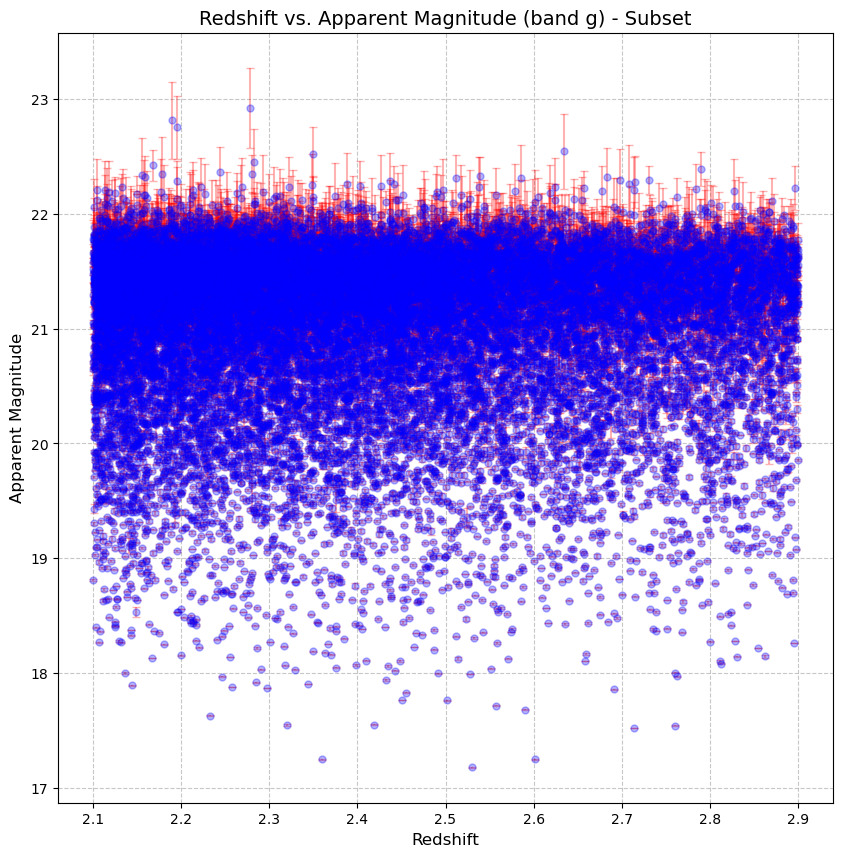

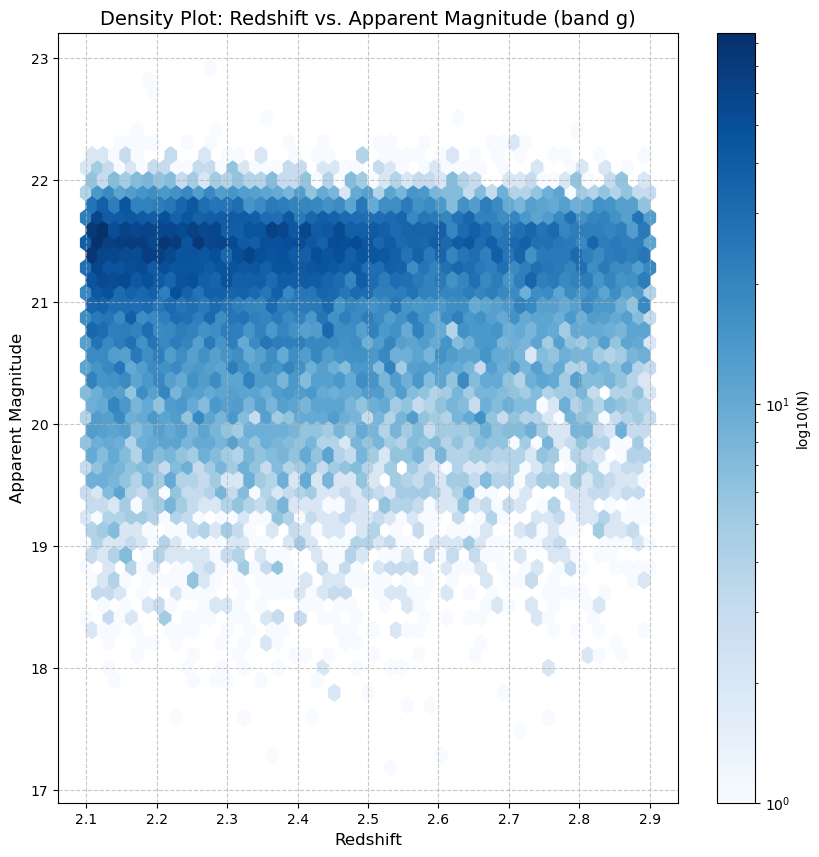

In [9]:
# Re-running the provided code with adjustments and saving the plots

# Filtering the data
# Creating and saving the errorbar plot
plt.figure(figsize=(10, 10))
plt.errorbar(filtered_z_g, filtered_apr_mag_g, yerr=filtered_magerr_g_1, fmt='o', color='blue', ecolor='red', capsize=3, markersize=5, alpha=0.3)
plt.title('Redshift vs. Apparent Magnitude (band g) - Subset', fontsize=14)
plt.xlabel('Redshift', fontsize=12)
plt.ylabel('Apparent Magnitude', fontsize=12)
plt.grid(True, linestyle='--', alpha=0.7)
plt.savefig('/global/u1/z/zhaozhon/k-correction/plot/apr_mag', dpi=300)  # Saving the errorbar plot

# Creating and saving the hexbin plot
plt.figure(figsize=(10, 10))
plt.hexbin(filtered_z_g, filtered_apr_mag_g, gridsize=50, cmap='Blues', bins='log')
plt.colorbar(label='log10(N)')
plt.title('Density Plot: Redshift vs. Apparent Magnitude (band g)', fontsize=14)
plt.xlabel('Redshift', fontsize=12)
plt.ylabel('Apparent Magnitude', fontsize=12)
plt.grid(True, linestyle='--', alpha=0.7)
plt.savefig('/global/u1/z/zhaozhon/k-correction/plot/apr_mag_density', dpi=300)  # Saving the hexbin plot

plt.show()  # Displaying the plots

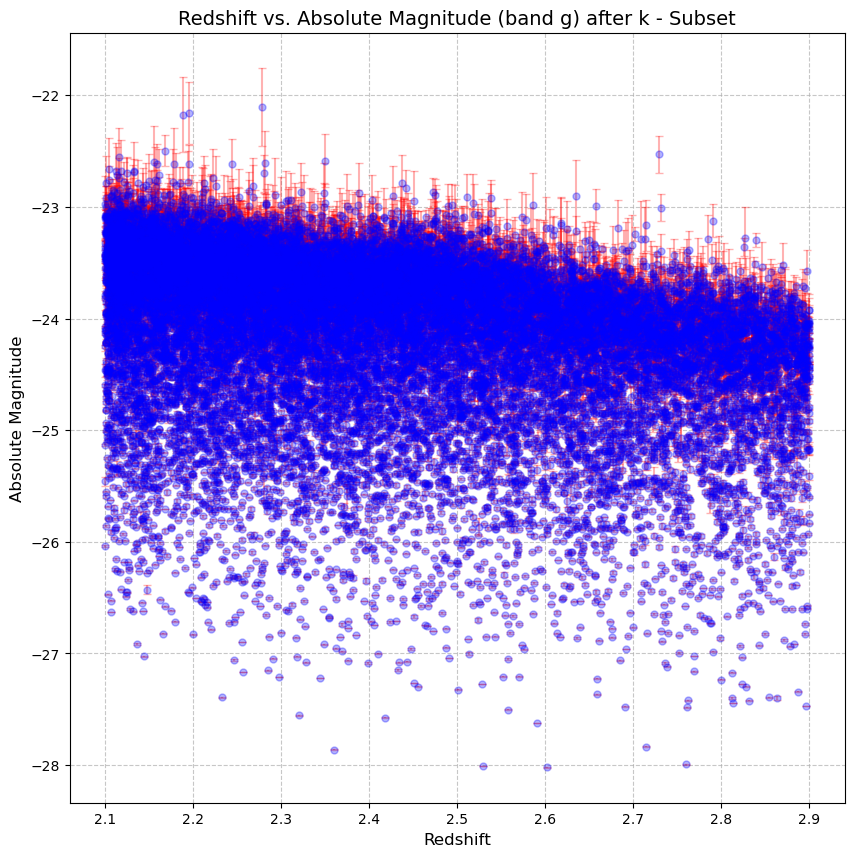

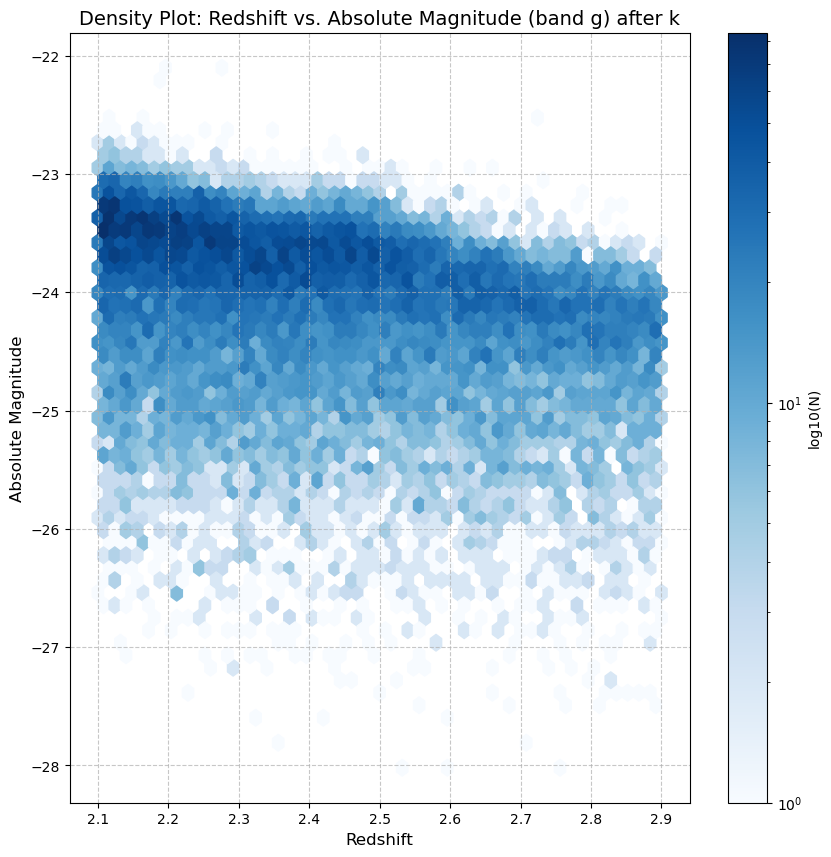

In [10]:
# Re-running the provided code with adjustments and saving the plots

# Filtering the data
# Creating and saving the errorbar plot
plt.figure(figsize=(10, 10))
plt.errorbar(filtered_z_g, k_abs_mag_g, yerr=filtered_magerr_g_1, fmt='o', color='blue', ecolor='red', capsize=3, markersize=5, alpha=0.3)
plt.title('Redshift vs. Absolute Magnitude (band g) after k - Subset', fontsize=14)
plt.xlabel('Redshift', fontsize=12)
plt.ylabel('Absolute Magnitude', fontsize=12)
plt.grid(True, linestyle='--', alpha=0.7)
plt.savefig('/global/u1/z/zhaozhon/k-correction/plot/after_k_g', dpi=300)  # Saving the errorbar plot

# Creating and saving the hexbin plot
plt.figure(figsize=(10, 10))
plt.hexbin(filtered_z_g, k_abs_mag_g, gridsize=50, cmap='Blues', bins='log')
plt.colorbar(label='log10(N)')
plt.title('Density Plot: Redshift vs. Absolute Magnitude (band g) after k', fontsize=14)
plt.xlabel('Redshift', fontsize=12)
plt.ylabel('Absolute Magnitude', fontsize=12)
plt.grid(True, linestyle='--', alpha=0.7)
plt.savefig('/global/u1/z/zhaozhon/k-correction/plot/after_k_density_g', dpi=300)  # Saving the hexbin plot

plt.show()  # Displaying the plots

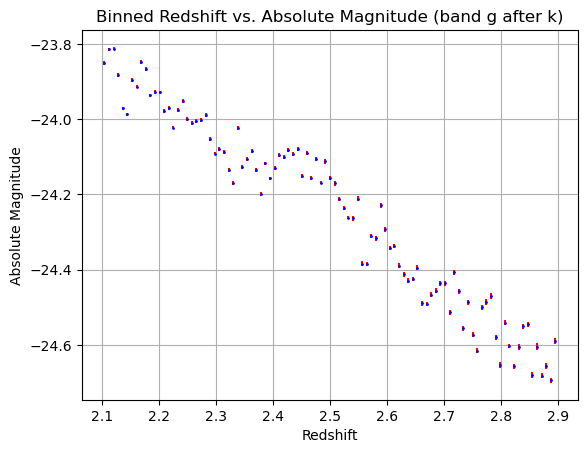

In [11]:
'''
plt.errorbar(filtered_z_g, k_abs_mag_g, yerr=filtered_magerr_g_1, fmt='o', color='b', ecolor='r', capsize=0,markersize=1)
plt.title('Redshift vs. Absolute Magnitude band g after k')
plt.xlabel('Redshift')
plt.ylabel('Absolute Magnitude')
plt.grid(True)
'''
bin_edges_g_ak = np.linspace(min(filtered_z_g), max(filtered_z_g), 100)  # Adjust the number of bins as needed
bin_centers_g_ak = 0.5 * (bin_edges_g_ak[:-1] + bin_edges_g_ak[1:])

# Bin the data
binned_magnitudes_g_ak = []
binned_errors_g_ak = []
for i in range(len(bin_edges_g_ak) - 1):
    # Select data points within the current bin
    in_bin = (filtered_z_g >= bin_edges_g_ak[i]) & (filtered_z_g < bin_edges_g_ak[i + 1])
    magnitudes = k_abs_mag_g[in_bin]
    errors = filtered_magerr_g_1[in_bin]

    # Calculate mean and standard error for the bin
    mean_magnitude = np.mean(magnitudes)
    stderr = np.sqrt(np.sum(errors**2)) / len(errors)

    binned_magnitudes_g_ak.append(mean_magnitude)
    binned_errors_g_ak.append(stderr)

# Plot
plt.errorbar(bin_centers_g_ak, binned_magnitudes_g_ak, yerr=binned_errors_g_ak, fmt='o', color='b', ecolor='r', capsize=0, markersize=1)
plt.title('Binned Redshift vs. Absolute Magnitude (band g after k)')
plt.xlabel('Redshift')
plt.ylabel('Absolute Magnitude')
plt.grid(True)
plt.show()

<function matplotlib.pyplot.show(close=None, block=None)>

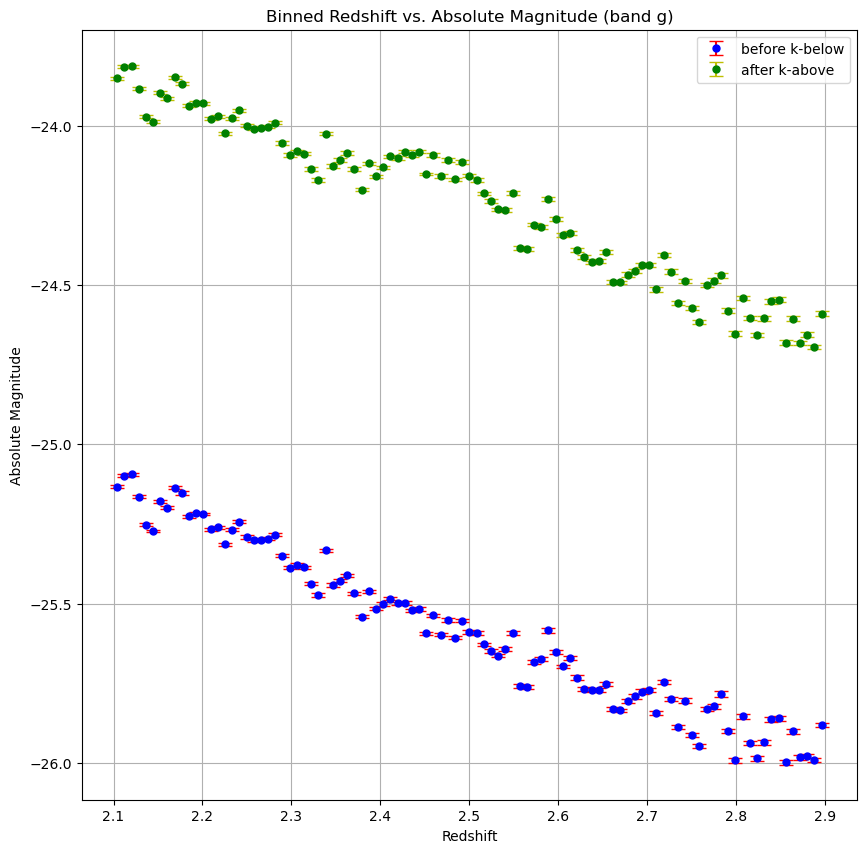

In [12]:
plt.figure(figsize=(10, 10))
plt.errorbar(bin_centers_g_bk, binned_magnitudes_g_bk, yerr=binned_errors_g_bk, fmt='o', color='b', ecolor='r', capsize=5, markersize=5,label='before k-below')
plt.errorbar(bin_centers_g_ak, binned_magnitudes_g_ak, yerr=binned_errors_g_ak, fmt='o', color='g', ecolor='y', capsize=5, markersize=5,label='after k-above')
plt.xlabel('Redshift')
plt.ylabel('Absolute Magnitude')
plt.legend()
plt.grid(True)
plt.title('Binned Redshift vs. Absolute Magnitude (band g)')
plt.savefig('/global/u1/z/zhaozhon/k-correction/plot/g1', dpi=300)
plt.show

<function matplotlib.pyplot.show(close=None, block=None)>

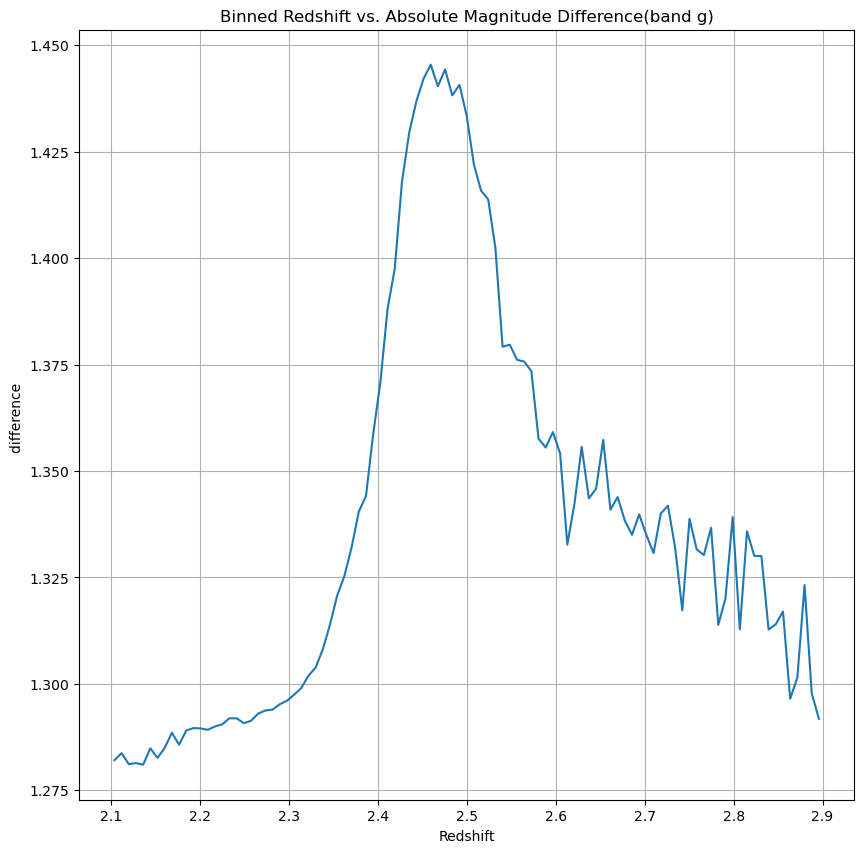

In [13]:
plt.figure(figsize=(10, 10))
plt.plot(bin_centers_g_bk,np.array(binned_magnitudes_g_ak)-np.array(binned_magnitudes_g_bk))
plt.xlabel('Redshift')
plt.ylabel('difference ')
plt.grid(True)
plt.title('Binned Redshift vs. Absolute Magnitude Difference(band g)')
plt.savefig('/global/u1/z/zhaozhon/k-correction/plot/g2', dpi=300)
plt.show

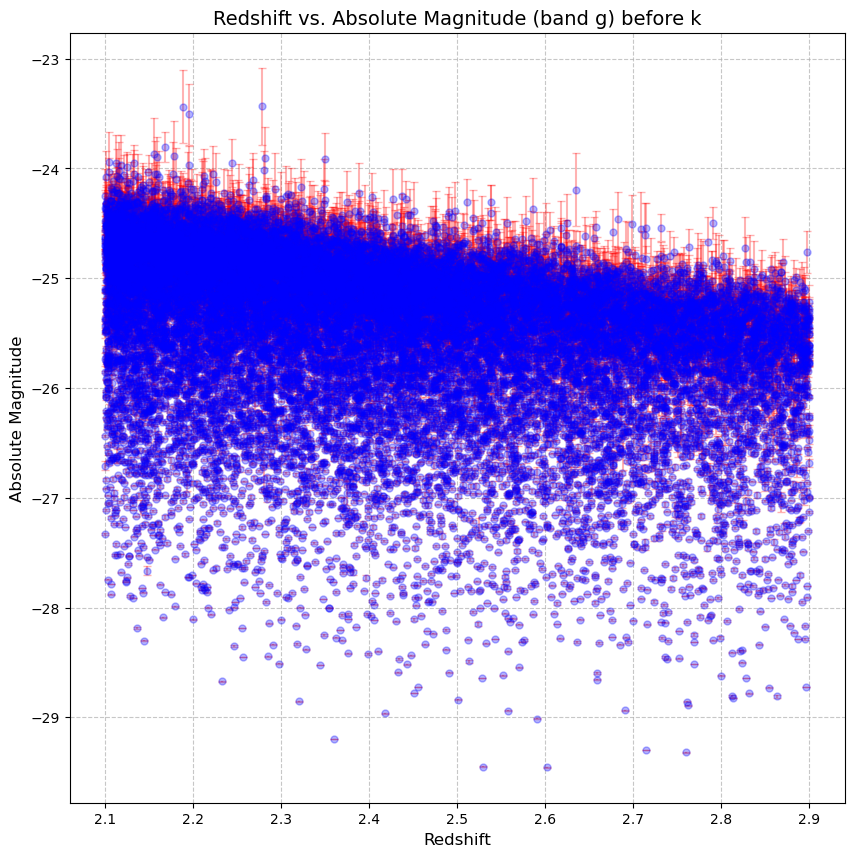

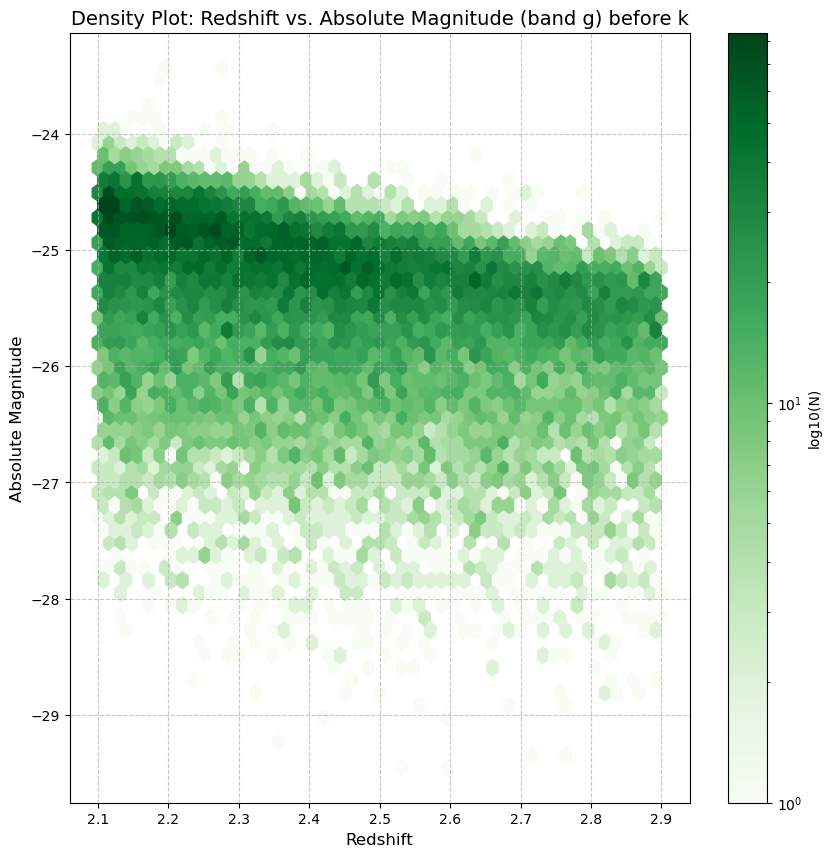

In [14]:
# Applying improvements to the new plot

# Selecting a random subset of the data
# Plotting the subset with error bars
plt.figure(figsize=(10, 10))
#plt.errorbar(filtered_z_g2[indices], filtered_abs_mag_g2[indices], yerr=filtered_magerr_g_12[indices], fmt='o', color='green', ecolor='red', capsize=3, markersize=5, alpha=0.5)
plt.errorbar(filtered_z_g, filtered_abs_mag_g, yerr=filtered_magerr_g_1, fmt='o', color='blue', ecolor='red', capsize=3, markersize=5, alpha=0.3)
plt.title('Redshift vs. Absolute Magnitude (band g) before k', fontsize=14)
plt.xlabel('Redshift', fontsize=12)
plt.ylabel('Absolute Magnitude', fontsize=12)
plt.grid(True, linestyle='--', alpha=0.7)
plt.savefig('/global/u1/z/zhaozhon/k-correction/plot/before_k_g', dpi=300)  # Saving the errorbar plot

# Adding a hexbin plot for density visualization of the full dataset
plt.figure(figsize=(10, 10))
plt.hexbin(filtered_z_g, filtered_abs_mag_g, gridsize=50, cmap='Greens', bins='log')
plt.colorbar(label='log10(N)')
plt.title('Density Plot: Redshift vs. Absolute Magnitude (band g) before k', fontsize=14)
plt.xlabel('Redshift', fontsize=12)
plt.ylabel('Absolute Magnitude', fontsize=12)
plt.grid(True, linestyle='--', alpha=0.7)
plt.savefig('/global/u1/z/zhaozhon/k-correction/plot/before_k_density_g', dpi=300)  # Saving the errorbar plot

plt.show()

# r band

In [15]:
tid_r=np.load('tid_r.npy')
k_r=np.load('k_r.npy')
index_r=np.load('index_r.npy')
abs_mag_r=np.load('/global/u1/z/zhaozhon/task/abs_mag_r.npy')
magerr_r_1=np.load('/global/u1/z/zhaozhon/task/magerr_r_1.npy')
z_r = np.load('/global/u1/z/zhaozhon/task/z_r.npy')
apr_mag_r=np.load('/global/u1/z/zhaozhon/task/apr_mag_r.npy')

In [16]:
index_r2 = np.isnan(k_r) | np.isneginf(k_r)
filtered_abs_mag_r = abs_mag_r[index_r][~index_r2]
filtered_apr_mag_r = apr_mag_r[index_r][~index_r2]
filtered_magerr_r_1 = magerr_r_1[index_r][~index_r2]
filtered_z_r = z_r[index_r][~index_r2]
tid_r = tid_r[~index_r2]
k_r = k_r[~index_r2]
k_abs_mag_r = filtered_abs_mag_r - k_r

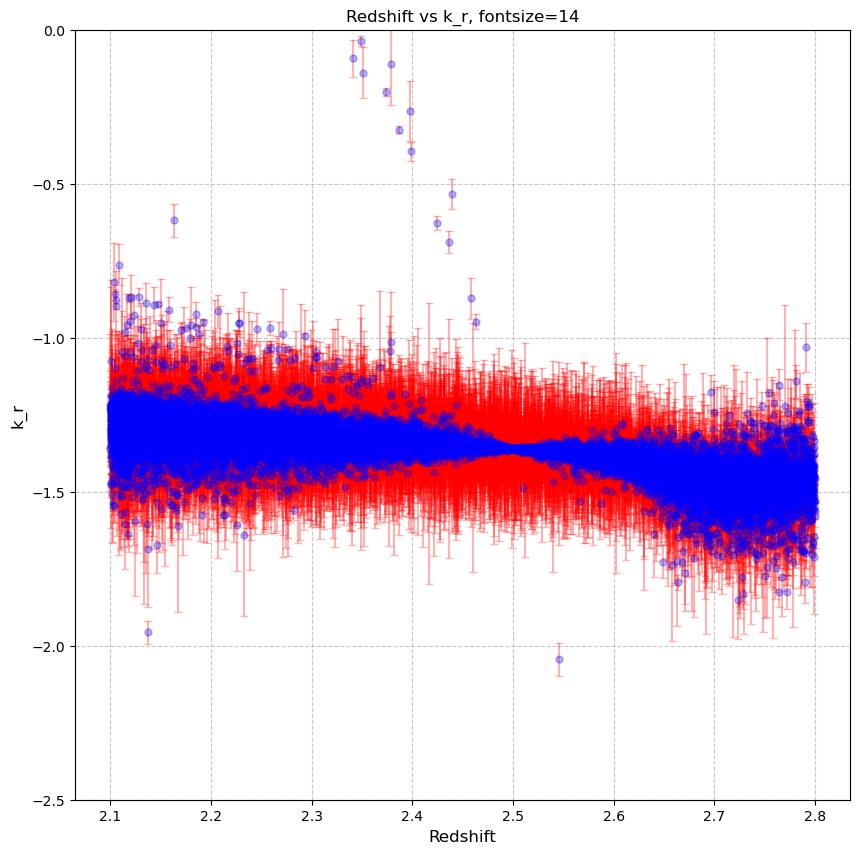

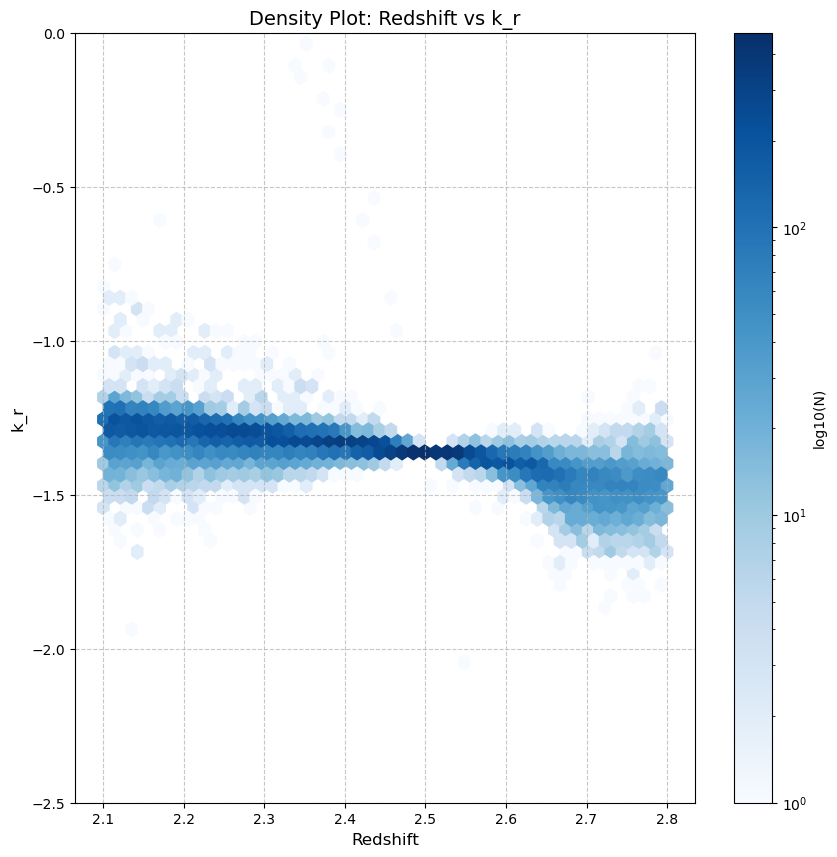

In [17]:
# Re-running the provided code with adjustments and saving the plots
indices = (k_r > -2.5) & (k_r < 0)
# Filtering the data
# Creating and saving the errorbar plot
plt.figure(figsize=(10, 10))
plt.errorbar(filtered_z_r[indices], k_r[indices], yerr=filtered_magerr_r_1[indices], fmt='o', color='blue', ecolor='red', capsize=3, markersize=5, alpha=0.3)
plt.title('Redshift vs k_r, fontsize=14')
plt.xlabel('Redshift', fontsize=12)
plt.ylabel('k_r', fontsize=12)
plt.ylim(-2.5,0)
plt.grid(True, linestyle='--', alpha=0.7)
plt.savefig('/global/u1/z/zhaozhon/k-correction/plot/k_r1', dpi=300)  # Saving the errorbar plot

# Creating and saving the hexbin plot
plt.figure(figsize=(10, 10))
plt.hexbin(filtered_z_r[indices], k_r[indices], gridsize=50, cmap='Blues', bins='log')
plt.colorbar(label='log10(N)')
plt.title('Density Plot: Redshift vs k_r', fontsize=14)
plt.xlabel('Redshift', fontsize=12)
plt.ylabel('k_r', fontsize=12)
plt.ylim(-2.5,0)
plt.grid(True, linestyle='--', alpha=0.7)
plt.savefig('/global/u1/z/zhaozhon/k-correction/plot/k_r2', dpi=300)  # Saving the hexbin plot

plt.show()  # Displaying the plots

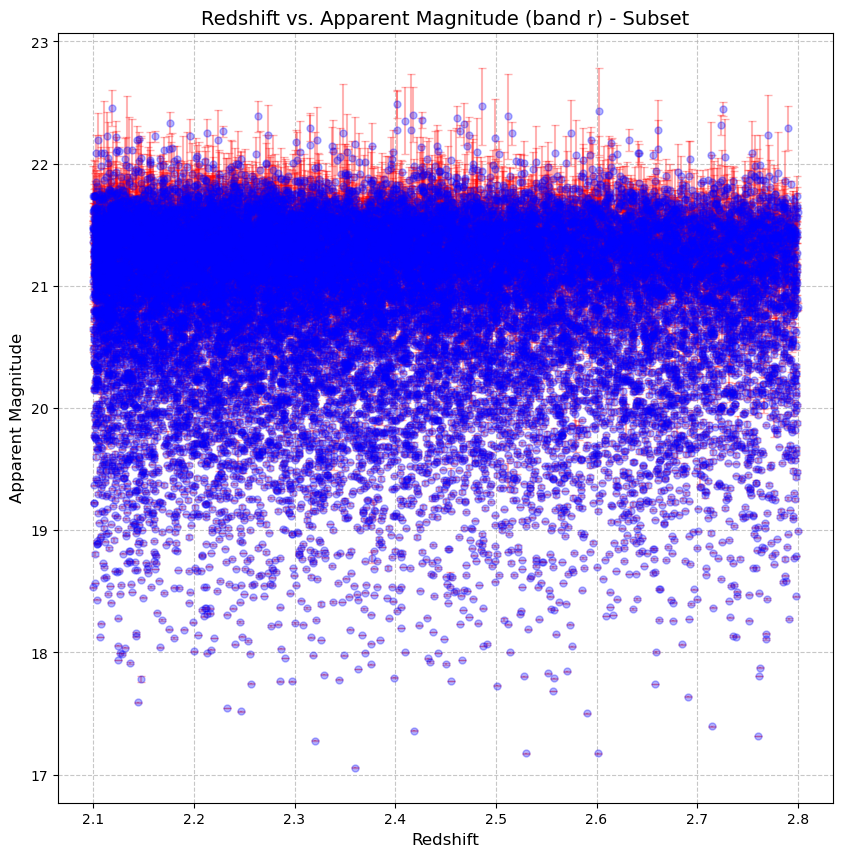

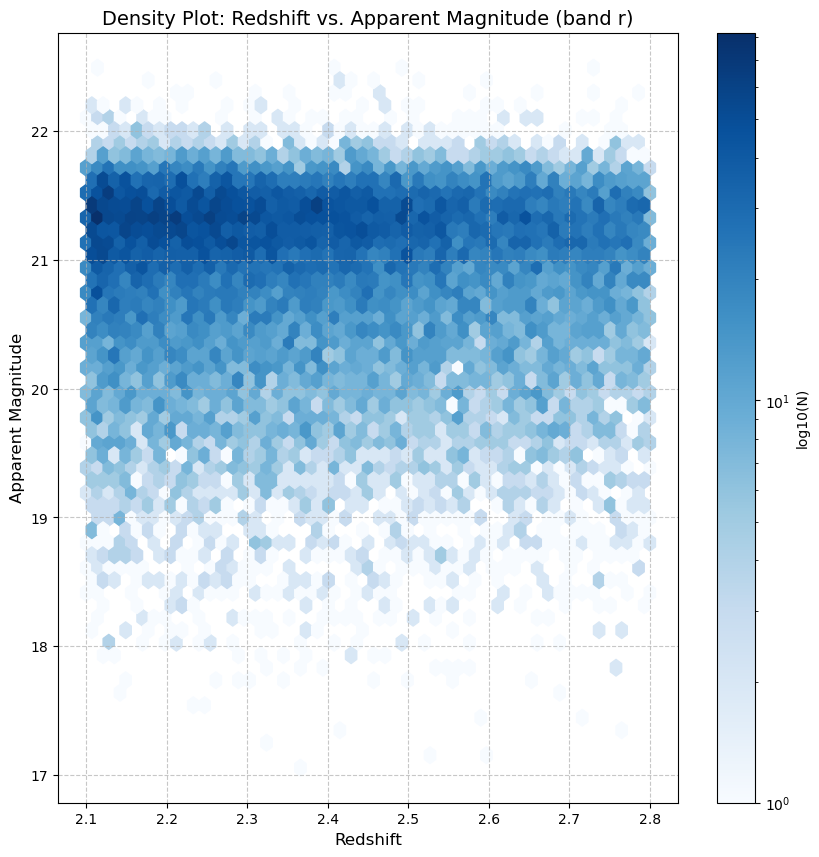

In [18]:
# Re-running the provided code with adjustments and saving the plots

# Filtering the data
# Creating and saving the errorbar plot
plt.figure(figsize=(10, 10))
plt.errorbar(filtered_z_r, filtered_apr_mag_r, yerr=filtered_magerr_r_1, fmt='o', color='blue', ecolor='red', capsize=3, markersize=5, alpha=0.3)
plt.title('Redshift vs. Apparent Magnitude (band r) - Subset', fontsize=14)
plt.xlabel('Redshift', fontsize=12)
plt.ylabel('Apparent Magnitude', fontsize=12)
plt.grid(True, linestyle='--', alpha=0.7)
plt.savefig('/global/u1/z/zhaozhon/k-correction/plot/apr_mag_r', dpi=300)  # Saving the errorbar plot

# Creating and saving the hexbin plot
plt.figure(figsize=(10, 10))
plt.hexbin(filtered_z_r, filtered_apr_mag_r, gridsize=50, cmap='Blues', bins='log')
plt.colorbar(label='log10(N)')
plt.title('Density Plot: Redshift vs. Apparent Magnitude (band r)', fontsize=14)
plt.xlabel('Redshift', fontsize=12)
plt.ylabel('Apparent Magnitude', fontsize=12)
plt.grid(True, linestyle='--', alpha=0.7)
plt.savefig('/global/u1/z/zhaozhon/k-correction/plot/apr_mag_density_r', dpi=300)  # Saving the hexbin plot

plt.show()  # Displaying the plots

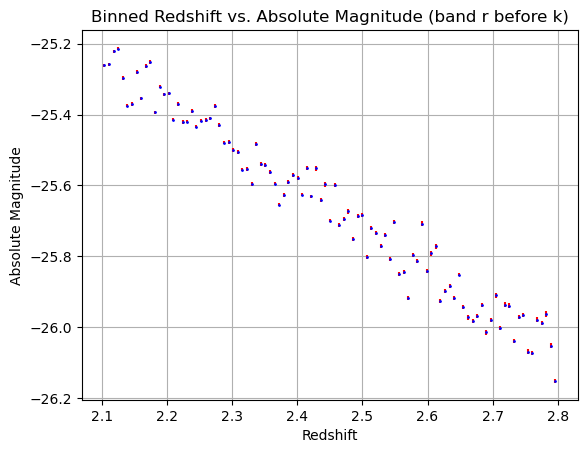

In [19]:
'''
plt.errorbar(filtered_z_r, filtered_abs_mag_r, yerr=filtered_magerr_r_1, fmt='o', color='b', ecolor='r', capsize=0,markersize=1)
plt.title('Redshift vs. Absolute Magnitude band i')
plt.xlabel('Redshift')
plt.ylabel('Absolute Magnitude')
plt.grid(True)
'''
bin_edges_r_bk = np.linspace(min(filtered_z_r), max(filtered_z_r), 100)  # Adjust the number of bins as needed
bin_centers_r_bk = 0.5 * (bin_edges_r_bk[:-1] + bin_edges_r_bk[1:])

# Bin the data
binned_magnitudes_r_bk = []
binned_errors_r_bk = []
for i in range(len(bin_edges_r_bk) - 1):
    # Select data points within the current bin
    in_bin = (filtered_z_r >= bin_edges_r_bk[i]) & (filtered_z_r < bin_edges_r_bk[i + 1])
    magnitudes = filtered_abs_mag_r[in_bin]
    errors = filtered_magerr_r_1[in_bin]

    # Calculate mean and standard error for the bin
    mean_magnitude = np.mean(magnitudes)
    stderr = np.sqrt(np.sum(errors**2)) / len(errors)

    binned_magnitudes_r_bk.append(mean_magnitude)
    binned_errors_r_bk.append(stderr)

# Plot
plt.errorbar(bin_centers_r_bk, binned_magnitudes_r_bk, yerr=binned_errors_r_bk, fmt='o', color='b', ecolor='r', capsize=0, markersize=1)
plt.title('Binned Redshift vs. Absolute Magnitude (band r before k)')
plt.xlabel('Redshift')
plt.ylabel('Absolute Magnitude')
plt.grid(True)
plt.show()

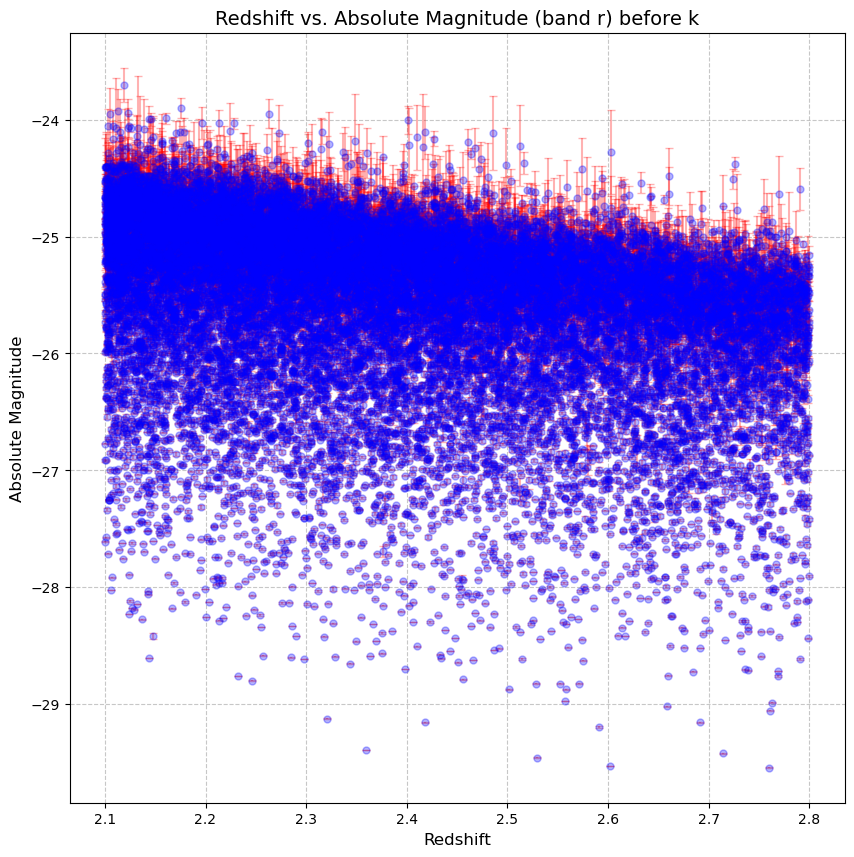

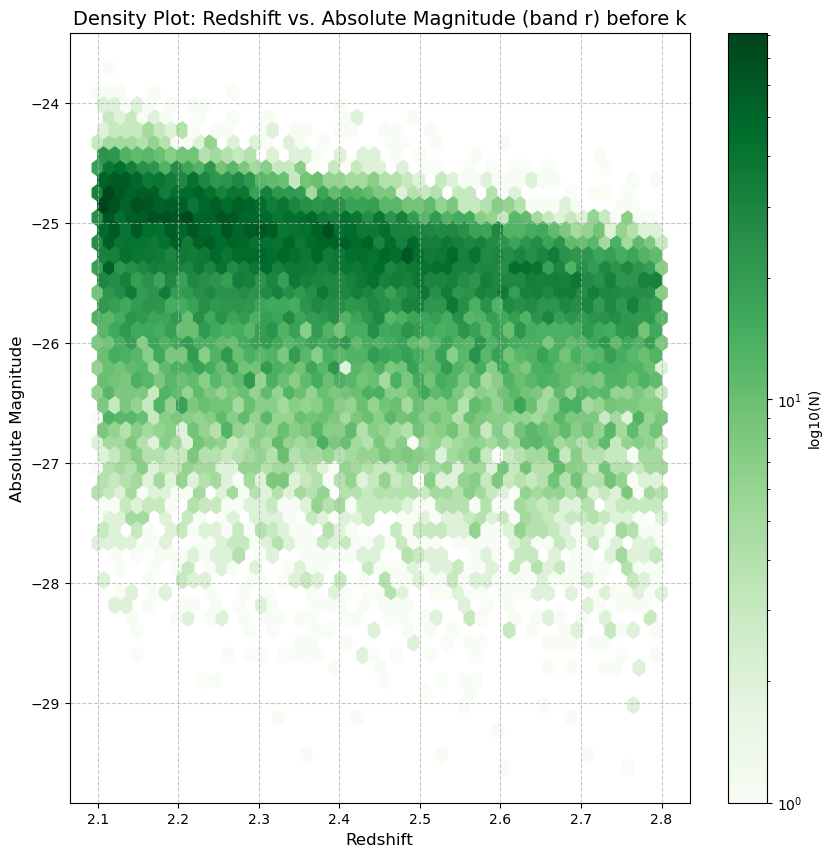

In [20]:
# Applying improvements to the new plot

# Selecting a random subset of the data
# Plotting the subset with error bars
plt.figure(figsize=(10, 10))
#plt.errorbar(filtered_z_g2[indices], filtered_abs_mag_g2[indices], yerr=filtered_magerr_g_12[indices], fmt='o', color='green', ecolor='red', capsize=3, markersize=5, alpha=0.5)
plt.errorbar(filtered_z_r, filtered_abs_mag_r, yerr=filtered_magerr_r_1, fmt='o', color='blue', ecolor='red', capsize=3, markersize=5, alpha=0.3)
plt.title('Redshift vs. Absolute Magnitude (band r) before k', fontsize=14)
plt.xlabel('Redshift', fontsize=12)
plt.ylabel('Absolute Magnitude', fontsize=12)
plt.grid(True, linestyle='--', alpha=0.7)
plt.savefig('/global/u1/z/zhaozhon/k-correction/plot/before_k_r', dpi=300)  # Saving the errorbar plot

# Adding a hexbin plot for density visualization of the full dataset
plt.figure(figsize=(10, 10))
plt.hexbin(filtered_z_r, filtered_abs_mag_r, gridsize=50, cmap='Greens', bins='log')
plt.colorbar(label='log10(N)')
plt.title('Density Plot: Redshift vs. Absolute Magnitude (band r) before k', fontsize=14)
plt.xlabel('Redshift', fontsize=12)
plt.ylabel('Absolute Magnitude', fontsize=12)
plt.grid(True, linestyle='--', alpha=0.7)
plt.savefig('/global/u1/z/zhaozhon/k-correction/plot/before_k_density_r', dpi=300)  # Saving the errorbar plot

plt.show()

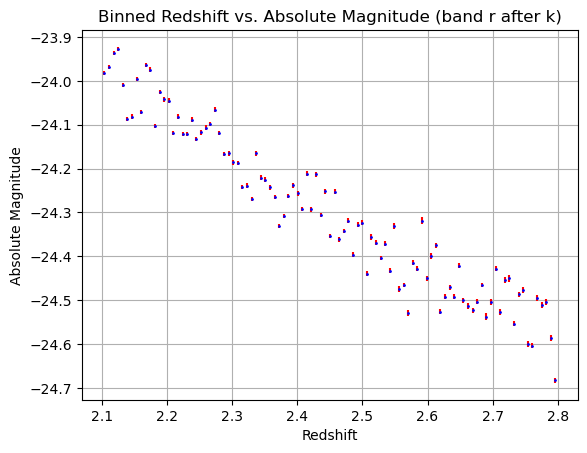

In [21]:
'''
plt.errorbar(filtered_z_r, k_abs_mag_r, yerr=filtered_magerr_r_1, fmt='o', color='b', ecolor='r', capsize=0,markersize=1)
plt.title('Redshift vs. Absolute Magnitude band i')
plt.xlabel('Redshift')
plt.ylabel('Absolute Magnitude')
plt.ylim(-28,-20)
plt.grid(True)
'''
indices = (k_abs_mag_r > -30) & (k_abs_mag_r < -22)
bin_edges_r_ak = np.linspace(min(filtered_z_r), max(filtered_z_r[indices]), 100)  # Adjust the number of bins as needed
bin_centers_r_ak = 0.5 * (bin_edges_r_ak[:-1] + bin_edges_r_ak[1:])

# Bin the data
binned_magnitudes_r_ak = []
binned_errors_r_ak = []
for i in range(len(bin_edges_r_ak) - 1):
    # Select data points within the current bin
    in_bin = (filtered_z_r[indices] >= bin_edges_r_ak[i]) & (filtered_z_r[indices] < bin_edges_r_ak[i + 1])
    magnitudes = k_abs_mag_r[indices][in_bin]
    errors = filtered_magerr_r_1[indices][in_bin]

    # Calculate mean and standard error for the bin
    mean_magnitude = np.mean(magnitudes)
    stderr = np.sqrt(np.sum(errors**2)) / len(errors)

    binned_magnitudes_r_ak.append(mean_magnitude)
    binned_errors_r_ak.append(stderr)

# Plot
plt.errorbar(bin_centers_r_ak, binned_magnitudes_r_ak, yerr=binned_errors_r_ak, fmt='o', color='b', ecolor='r', capsize=0, markersize=1)
plt.title('Binned Redshift vs. Absolute Magnitude (band r after k)')
plt.xlabel('Redshift')
plt.ylabel('Absolute Magnitude')
plt.grid(True)
plt.show()

<function matplotlib.pyplot.show(close=None, block=None)>

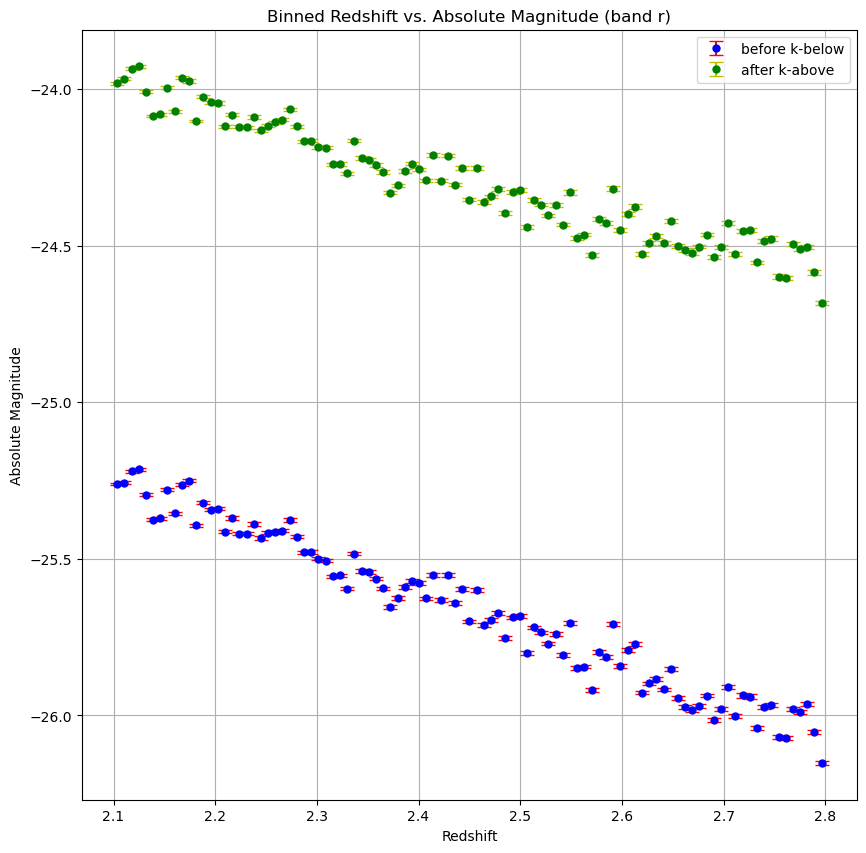

In [22]:
plt.figure(figsize=(10, 10))
plt.errorbar(bin_centers_r_bk, binned_magnitudes_r_bk, yerr=binned_errors_r_bk, fmt='o', color='b', ecolor='r', capsize=5, markersize=5,label='before k-below')
plt.errorbar(bin_centers_r_ak, binned_magnitudes_r_ak, yerr=binned_errors_r_ak, fmt='o', color='g', ecolor='y', capsize=5, markersize=5,label='after k-above')
plt.xlabel('Redshift')
plt.ylabel('Absolute Magnitude')
plt.legend()
plt.grid(True)
plt.title('Binned Redshift vs. Absolute Magnitude (band r)')
plt.savefig('/global/u1/z/zhaozhon/k-correction/plot/r1', dpi=300)
plt.show

<function matplotlib.pyplot.show(close=None, block=None)>

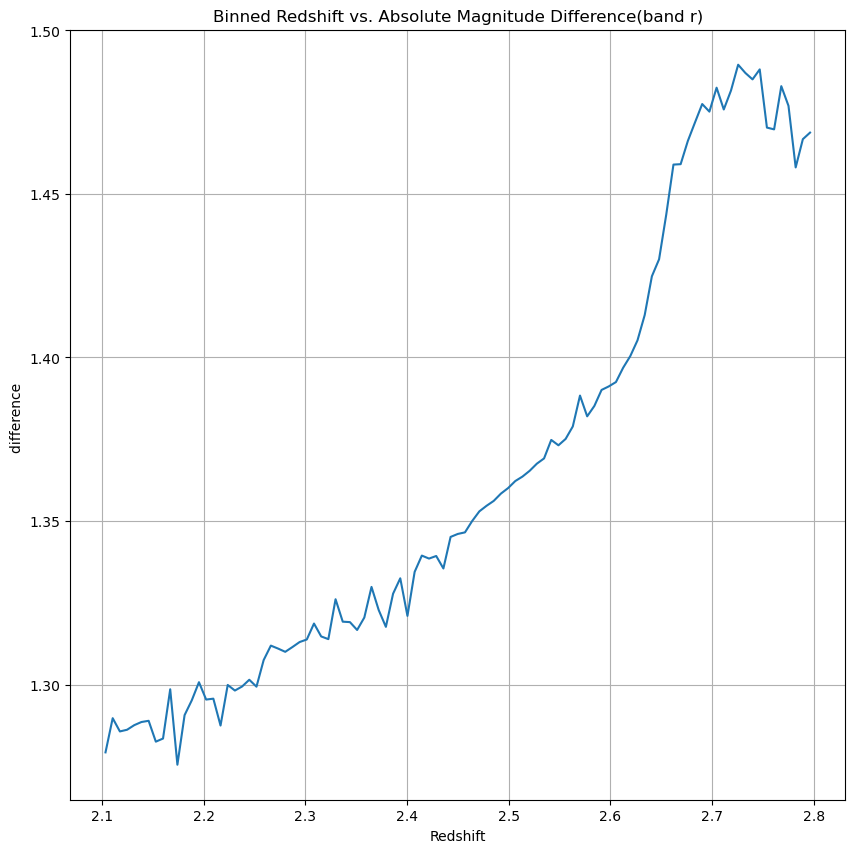

In [23]:
plt.figure(figsize=(10, 10))
plt.plot(bin_centers_r_bk,np.array(binned_magnitudes_r_ak)-np.array(binned_magnitudes_r_bk))
plt.xlabel('Redshift')
plt.ylabel('difference ')
plt.grid(True)
plt.title('Binned Redshift vs. Absolute Magnitude Difference(band r)')
plt.savefig('/global/u1/z/zhaozhon/k-correction/plot/r2', dpi=300)
plt.show

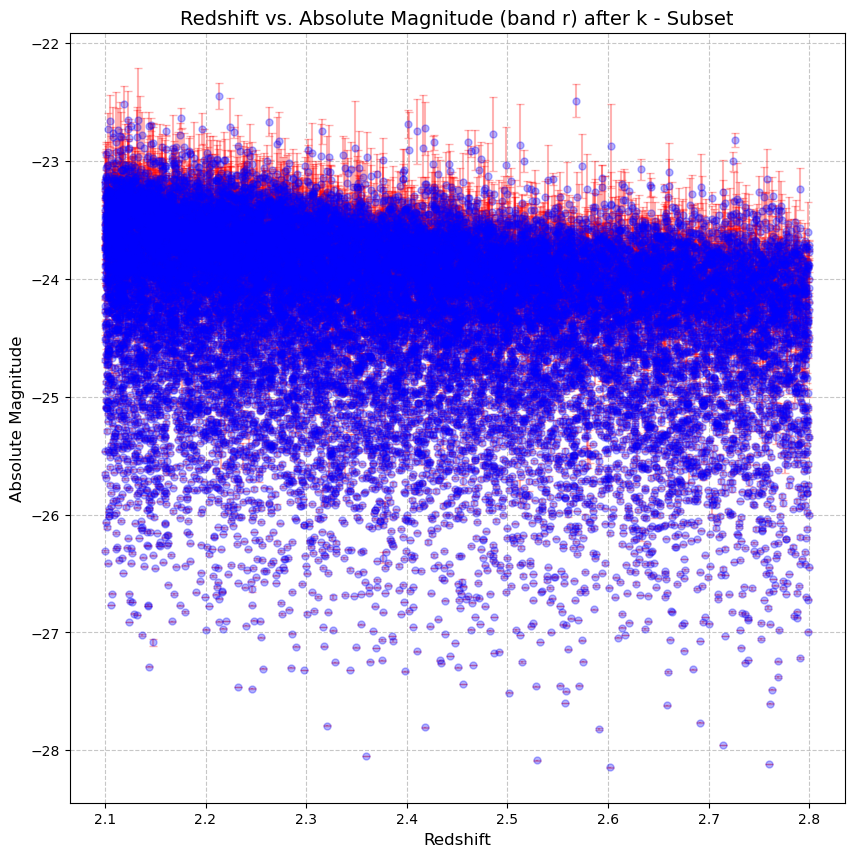

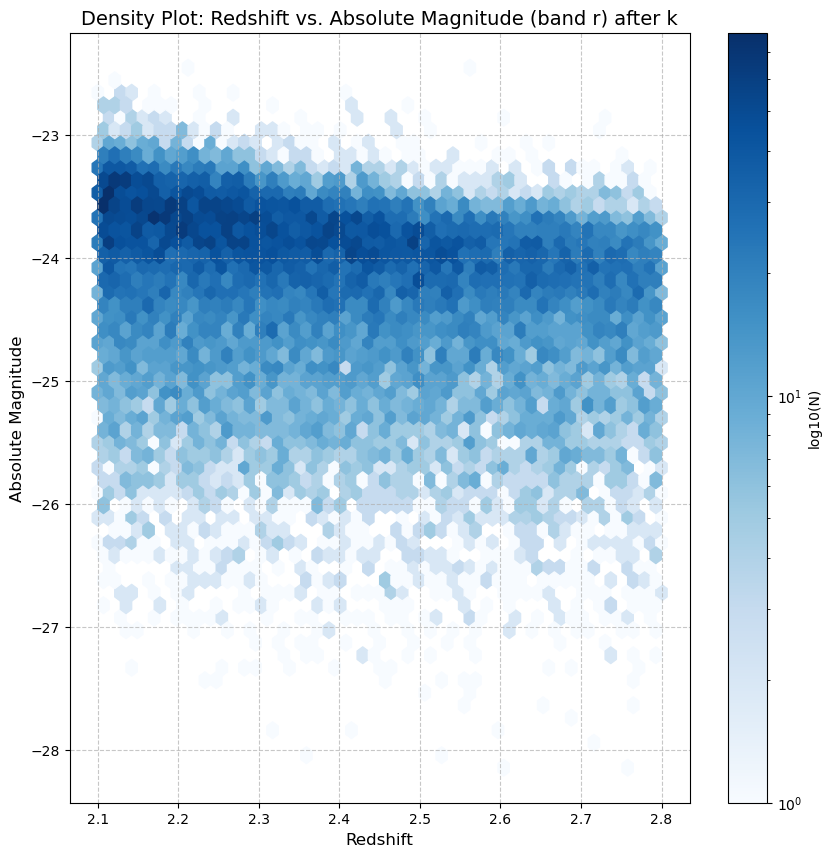

In [24]:
# Re-running the provided code with adjustments and saving the plots

# Filtering the data
indices = (k_abs_mag_r > -30) & (k_abs_mag_r < -20)

# Creating and saving the errorbar plot
plt.figure(figsize=(10, 10))
plt.errorbar(filtered_z_r[indices], k_abs_mag_r[indices], yerr=filtered_magerr_r_1[indices], fmt='o', color='blue', ecolor='red', capsize=3, markersize=5, alpha=0.3)
plt.title('Redshift vs. Absolute Magnitude (band r) after k - Subset', fontsize=14)
plt.xlabel('Redshift', fontsize=12)
plt.ylabel('Absolute Magnitude', fontsize=12)
plt.grid(True, linestyle='--', alpha=0.7)
plt.savefig('/global/u1/z/zhaozhon/k-correction/plot/after_k_r', dpi=300)  # Saving the errorbar plot

# Creating and saving the hexbin plot
plt.figure(figsize=(10, 10))
plt.hexbin(filtered_z_r[indices], k_abs_mag_r[indices], gridsize=50, cmap='Blues', bins='log')
plt.colorbar(label='log10(N)')
plt.title('Density Plot: Redshift vs. Absolute Magnitude (band r) after k', fontsize=14)
plt.xlabel('Redshift', fontsize=12)
plt.ylabel('Absolute Magnitude', fontsize=12)
plt.grid(True, linestyle='--', alpha=0.7)
plt.savefig('/global/u1/z/zhaozhon/k-correction/plot/after_k_density_r', dpi=300)  # Saving the hexbin plot

plt.show()  # Displaying the plots

# i band

In [25]:
tid_i=np.load('tid_i.npy')
k_i=np.load('k_i.npy')
index_i=np.load('index_i.npy')
abs_mag_i=np.load('/global/u1/z/zhaozhon/task/abs_mag_i.npy')
magerr_i_1=np.load('/global/u1/z/zhaozhon/task/magerr_i_1.npy')
z_i = np.load('/global/u1/z/zhaozhon/task/z_i.npy')
apr_mag_i=np.load('/global/u1/z/zhaozhon/task/apr_mag_i.npy')

In [26]:
index_i2 = np.isnan(k_i) | np.isneginf(k_i)
filtered_abs_mag_i = abs_mag_i[index_i][~index_i2]
filtered_apr_mag_i = apr_mag_i[index_i][~index_i2]
filtered_magerr_i_1 = magerr_i_1[index_i][~index_i2]
filtered_z_i = z_i[index_i][~index_i2]
tid_i = tid_i[~index_i2]
k_i = k_i[~index_i2]
k_abs_mag_i = filtered_abs_mag_i - k_i

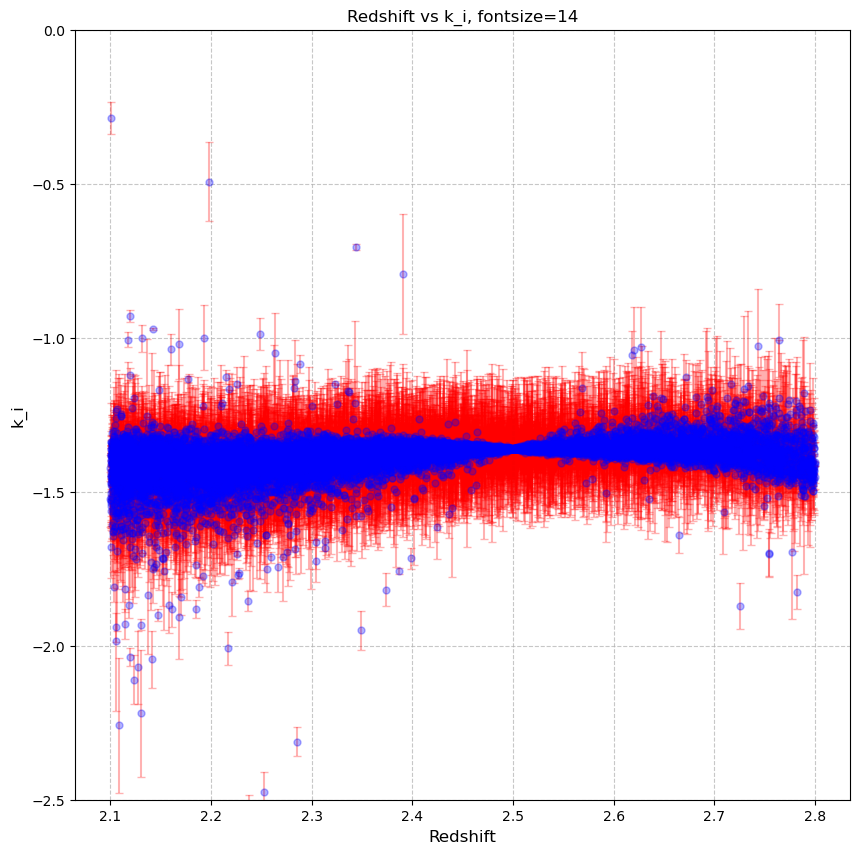

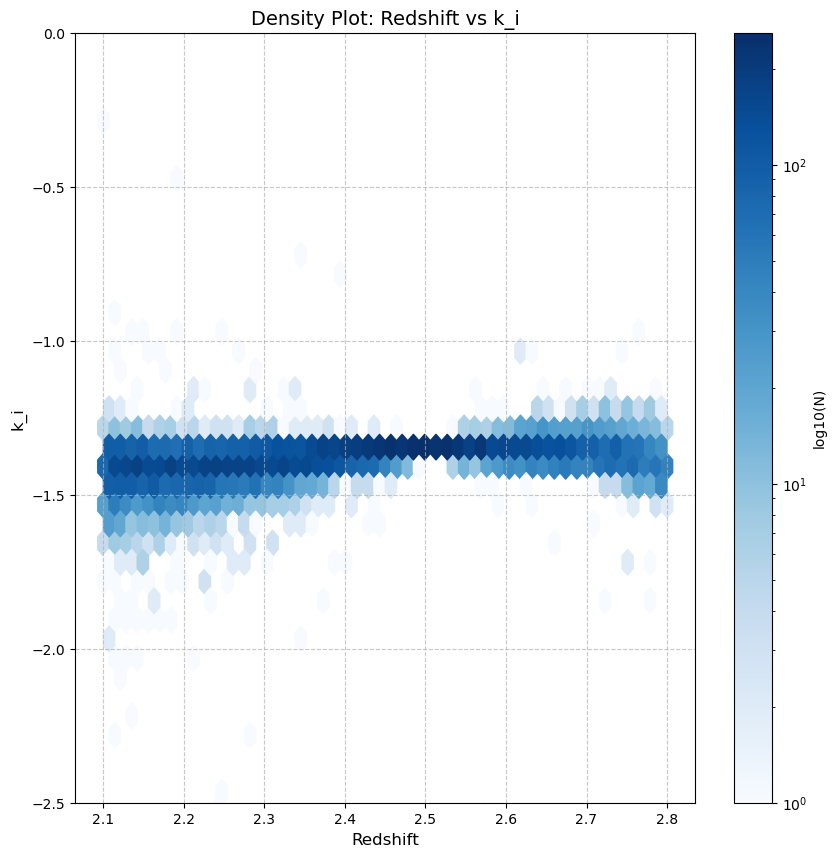

In [27]:
# Re-running the provided code with adjustments and saving the plots

# Filtering the data
# Creating and saving the errorbar plot
plt.figure(figsize=(10, 10))
plt.errorbar(filtered_z_i, k_i, yerr=filtered_magerr_i_1, fmt='o', color='blue', ecolor='red', capsize=3, markersize=5, alpha=0.3)
plt.title('Redshift vs k_i, fontsize=14')
plt.xlabel('Redshift', fontsize=12)
plt.ylabel('k_i', fontsize=12)
plt.ylim(-2.5,0)
plt.grid(True, linestyle='--', alpha=0.7)
plt.savefig('/global/u1/z/zhaozhon/k-correction/plot/k_i1', dpi=300)  # Saving the errorbar plot

# Creating and saving the hexbin plot
plt.figure(figsize=(10, 10))
plt.hexbin(filtered_z_i, k_i, gridsize=50, cmap='Blues', bins='log')
plt.colorbar(label='log10(N)')
plt.title('Density Plot: Redshift vs k_i', fontsize=14)
plt.xlabel('Redshift', fontsize=12)
plt.ylabel('k_i', fontsize=12)
plt.ylim(-2.5,0)
plt.grid(True, linestyle='--', alpha=0.7)
plt.savefig('/global/u1/z/zhaozhon/k-correction/plot/k_i2', dpi=300)  # Saving the hexbin plot

plt.show()  # Displaying the plots

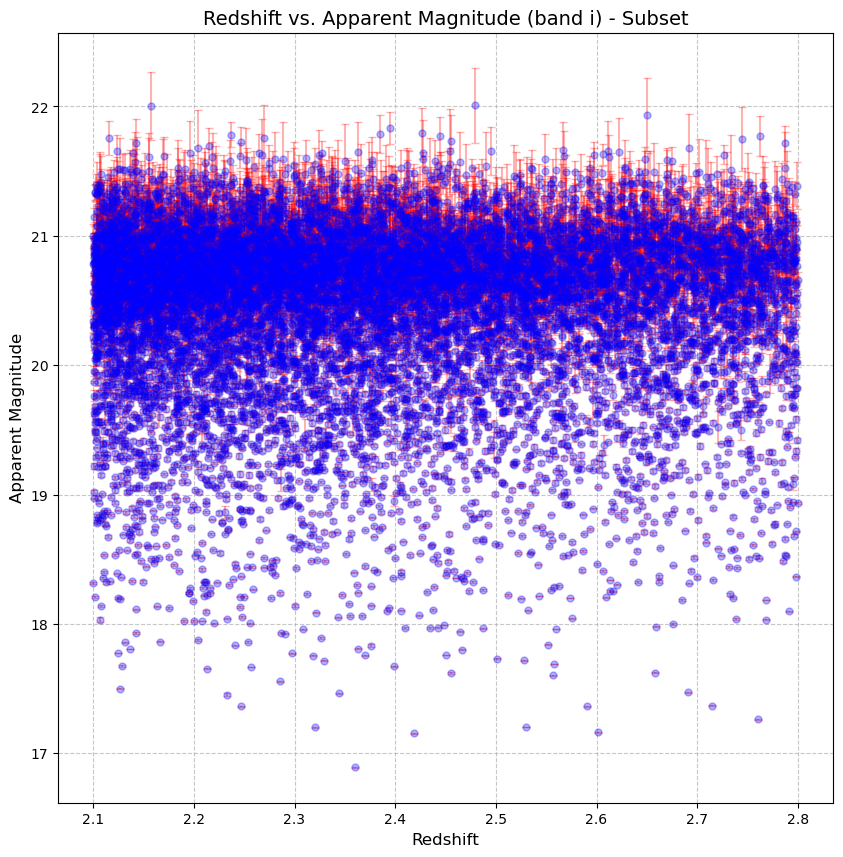

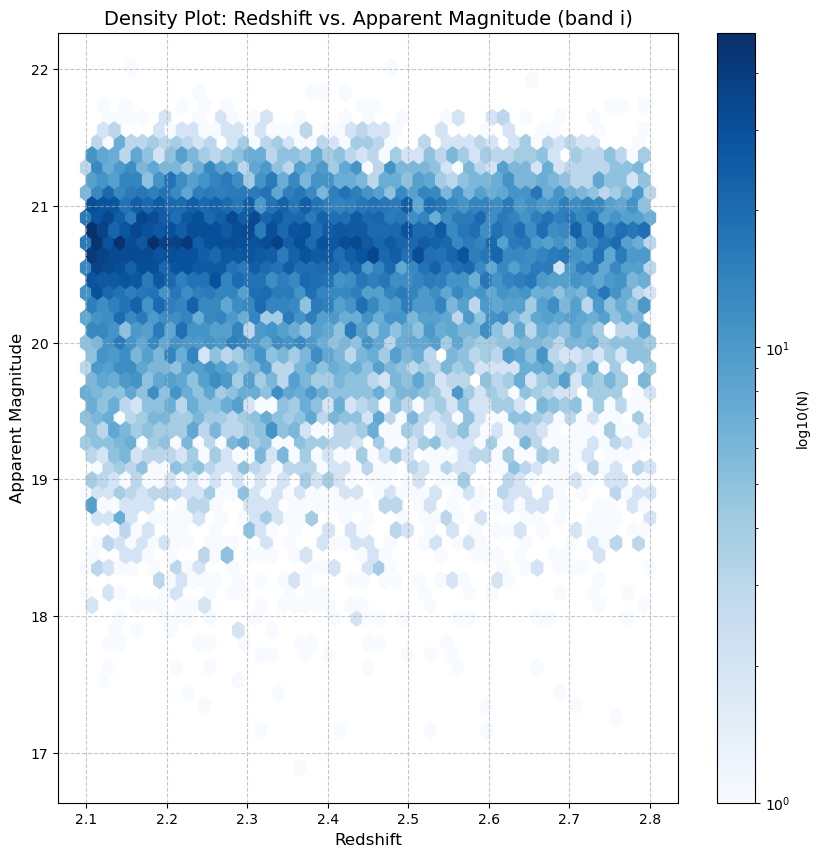

In [28]:
# Re-running the provided code with adjustments and saving the plots

# Filtering the data
# Creating and saving the errorbar plot
plt.figure(figsize=(10, 10))
plt.errorbar(filtered_z_i, filtered_apr_mag_i, yerr=filtered_magerr_i_1, fmt='o', color='blue', ecolor='red', capsize=3, markersize=5, alpha=0.3)
plt.title('Redshift vs. Apparent Magnitude (band i) - Subset', fontsize=14)
plt.xlabel('Redshift', fontsize=12)
plt.ylabel('Apparent Magnitude', fontsize=12)
plt.grid(True, linestyle='--', alpha=0.7)
plt.savefig('/global/u1/z/zhaozhon/k-correction/plot/apr_mag_i', dpi=300)  # Saving the errorbar plot

# Creating and saving the hexbin plot
plt.figure(figsize=(10, 10))
plt.hexbin(filtered_z_i, filtered_apr_mag_i, gridsize=50, cmap='Blues', bins='log')
plt.colorbar(label='log10(N)')
plt.title('Density Plot: Redshift vs. Apparent Magnitude (band i)', fontsize=14)
plt.xlabel('Redshift', fontsize=12)
plt.ylabel('Apparent Magnitude', fontsize=12)
plt.grid(True, linestyle='--', alpha=0.7)
plt.savefig('/global/u1/z/zhaozhon/k-correction/plot/apr_mag_density_i', dpi=300)  # Saving the hexbin plot

plt.show()  # Displaying the plots

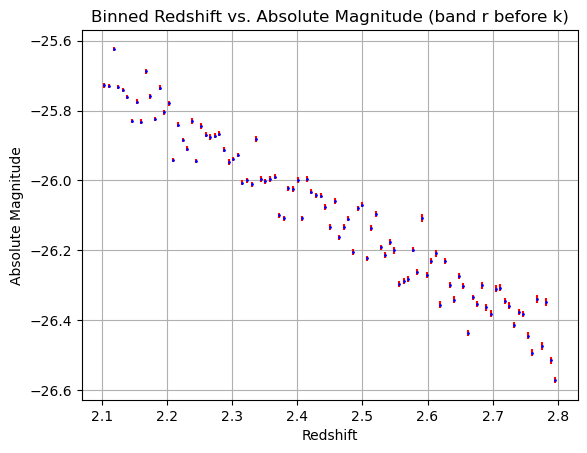

In [29]:
'''
plt.errorbar(filtered_z_i, filtered_abs_mag_i, yerr=filtered_magerr_i_1, fmt='o', color='b', ecolor='r', capsize=0,markersize=1)
plt.title('Redshift vs. Absolute Magnitude band i')
plt.xlabel('Redshift')
plt.ylabel('Absolute Magnitude')
plt.grid(True)
'''
bin_edges_i_bk = np.linspace(min(filtered_z_i), max(filtered_z_i), 100)  # Adjust the number of bins as needed
bin_centers_i_bk = 0.5 * (bin_edges_i_bk[:-1] + bin_edges_i_bk[1:])

# Bin the data
binned_magnitudes_i_bk = []
binned_errors_i_bk = []
for i in range(len(bin_edges_i_bk) - 1):
    # Select data points within the current bin
    in_bin = (filtered_z_i >= bin_edges_i_bk[i]) & (filtered_z_i < bin_edges_i_bk[i + 1])
    magnitudes = filtered_abs_mag_i[in_bin]
    errors = filtered_magerr_i_1[in_bin]

    # Calculate mean and standard error for the bin
    mean_magnitude = np.mean(magnitudes)
    stderr = np.sqrt(np.sum(errors**2)) / len(errors)

    binned_magnitudes_i_bk.append(mean_magnitude)
    binned_errors_i_bk.append(stderr)

# Plot
plt.errorbar(bin_centers_i_bk, binned_magnitudes_i_bk, yerr=binned_errors_i_bk, fmt='o', color='b', ecolor='r', capsize=0, markersize=1)
plt.title('Binned Redshift vs. Absolute Magnitude (band r before k)')
plt.xlabel('Redshift')
plt.ylabel('Absolute Magnitude')
plt.grid(True)
plt.show()

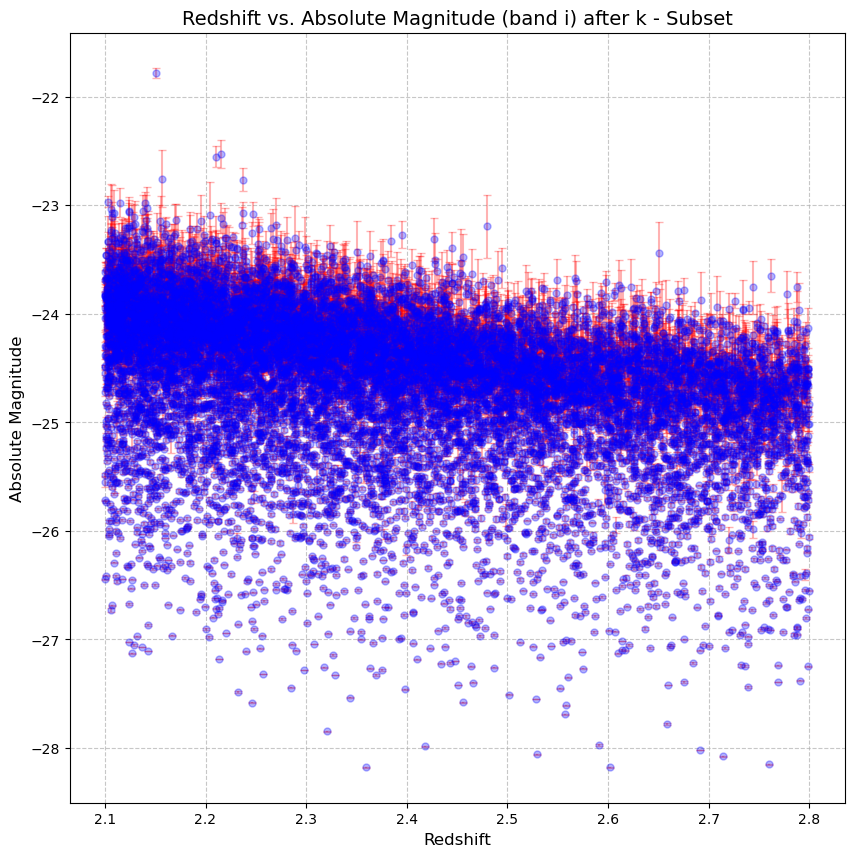

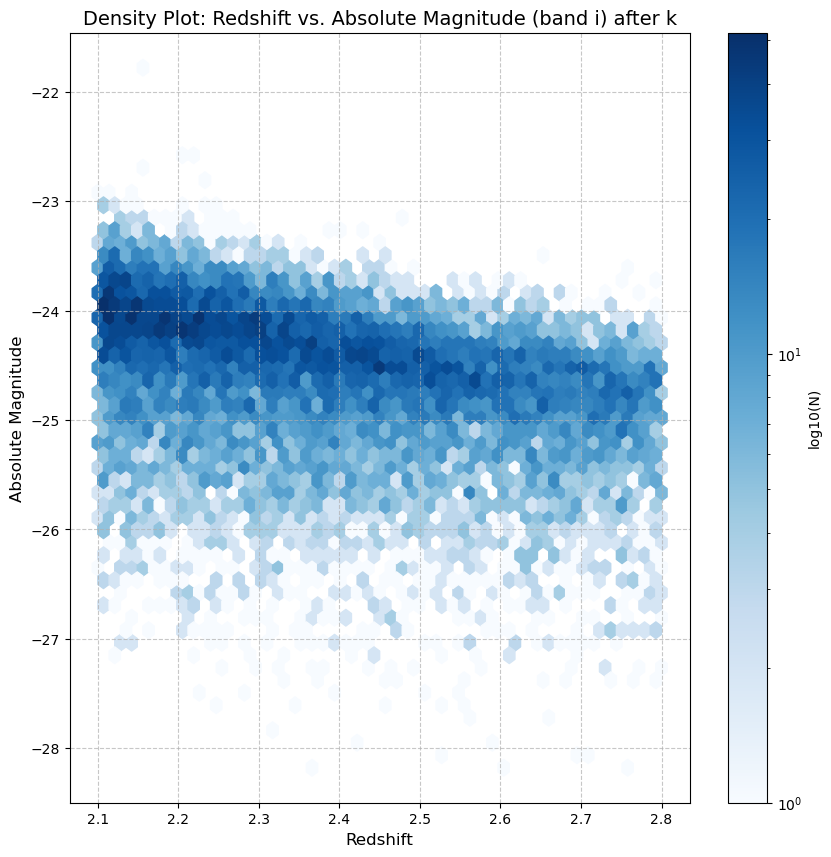

In [30]:
# Re-running the provided code with adjustments and saving the plots

# Filtering the data
# Creating and saving the errorbar plot
plt.figure(figsize=(10, 10))
plt.errorbar(filtered_z_i, k_abs_mag_i, yerr=filtered_magerr_i_1, fmt='o', color='blue', ecolor='red', capsize=3, markersize=5, alpha=0.3)
plt.title('Redshift vs. Absolute Magnitude (band i) after k - Subset', fontsize=14)
plt.xlabel('Redshift', fontsize=12)
plt.ylabel('Absolute Magnitude', fontsize=12)
plt.grid(True, linestyle='--', alpha=0.7)
plt.savefig('/global/u1/z/zhaozhon/k-correction/plot/after_k_i', dpi=300)  # Saving the errorbar plot

# Creating and saving the hexbin plot
plt.figure(figsize=(10, 10))
plt.hexbin(filtered_z_i, k_abs_mag_i, gridsize=50, cmap='Blues', bins='log')
plt.colorbar(label='log10(N)')
plt.title('Density Plot: Redshift vs. Absolute Magnitude (band i) after k', fontsize=14)
plt.xlabel('Redshift', fontsize=12)
plt.ylabel('Absolute Magnitude', fontsize=12)
plt.grid(True, linestyle='--', alpha=0.7)
plt.savefig('/global/u1/z/zhaozhon/k-correction/plot/after_k_density_i', dpi=300)  # Saving the hexbin plot

plt.show()  # Displaying the plots

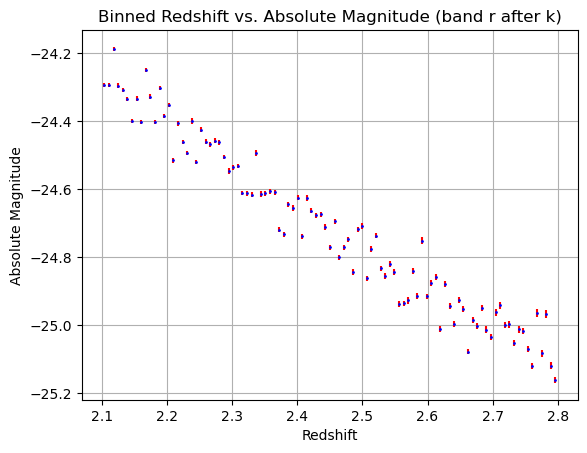

In [31]:
'''
plt.errorbar(filtered_z_i, k_abs_mag_i, yerr=filtered_magerr_i_1, fmt='o', color='b', ecolor='r', capsize=0,markersize=1)
plt.title('Redshift vs. Absolute Magnitude band i')
plt.xlabel('Redshift')
plt.ylabel('Absolute Magnitude')
plt.ylim(-28,-20)
plt.grid(True)
'''
indices = (k_abs_mag_i > -30) & (k_abs_mag_i < -22)
bin_edges_i_ak = np.linspace(min(filtered_z_i), max(filtered_z_i), 100)  # Adjust the number of bins as needed
bin_centers_i_ak = 0.5 * (bin_edges_i_ak[:-1] + bin_edges_i_ak[1:])

# Bin the data
binned_magnitudes_i_ak = []
binned_errors_i_ak = []
for i in range(len(bin_edges_i_ak) - 1):
    # Select data points within the current bin
    in_bin = (filtered_z_i >= bin_edges_i_ak[i]) & (filtered_z_i < bin_edges_i_ak[i + 1])
    magnitudes = k_abs_mag_i[in_bin]
    errors = filtered_magerr_i_1[in_bin]

    # Calculate mean and standard error for the bin
    mean_magnitude = np.mean(magnitudes)
    stderr = np.sqrt(np.sum(errors**2)) / len(errors)

    binned_magnitudes_i_ak.append(mean_magnitude)
    binned_errors_i_ak.append(stderr)

# Plot
plt.errorbar(bin_centers_i_ak, binned_magnitudes_i_ak, yerr=binned_errors_i_ak, fmt='o', color='b', ecolor='r', capsize=0, markersize=1)
plt.title('Binned Redshift vs. Absolute Magnitude (band r after k)')
plt.xlabel('Redshift')
plt.ylabel('Absolute Magnitude')
plt.grid(True)
plt.show()

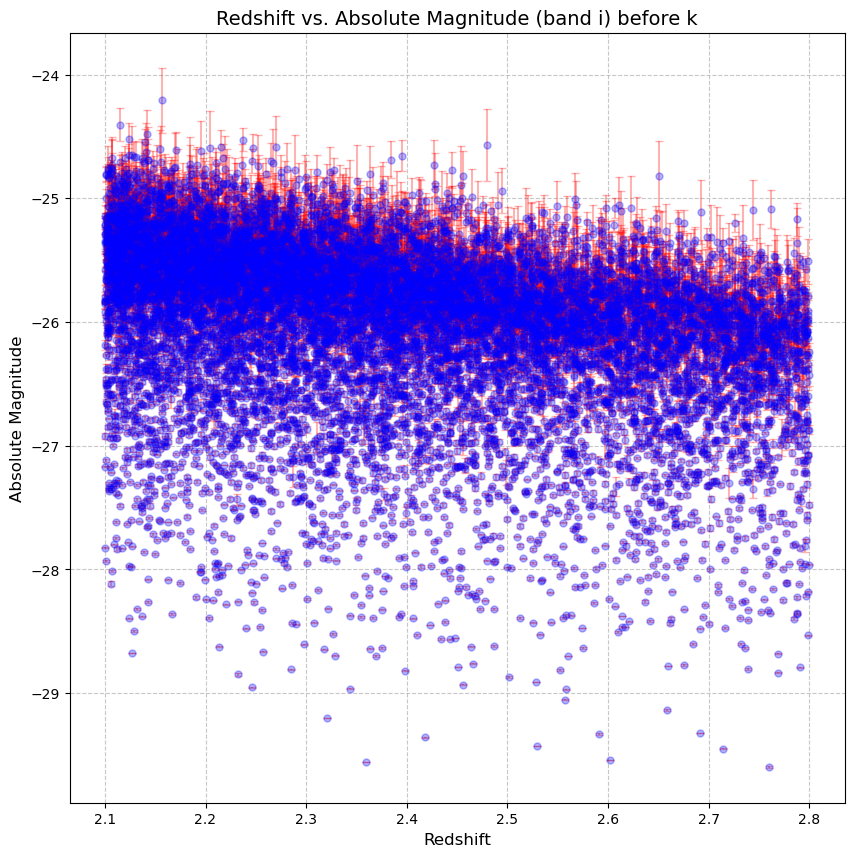

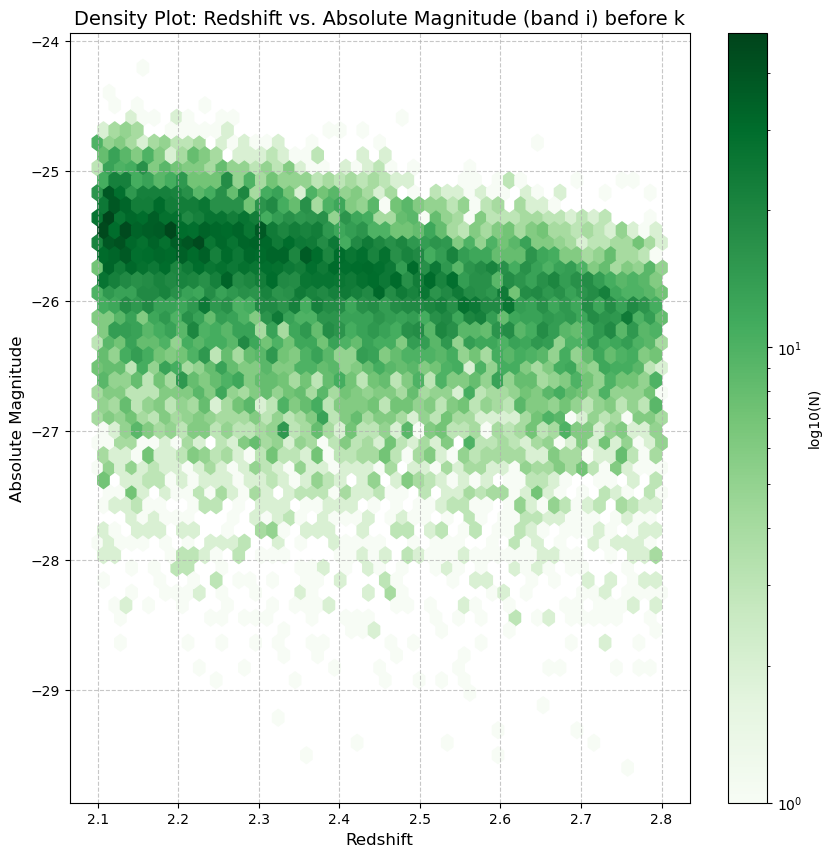

In [32]:
# Applying improvements to the new plot

# Selecting a random subset of the data
# Plotting the subset with error bars
plt.figure(figsize=(10, 10))
#plt.errorbar(filtered_z_g2[indices], filtered_abs_mag_g2[indices], yerr=filtered_magerr_g_12[indices], fmt='o', color='green', ecolor='red', capsize=3, markersize=5, alpha=0.5)
plt.errorbar(filtered_z_i, filtered_abs_mag_i, yerr=filtered_magerr_i_1, fmt='o', color='blue', ecolor='red', capsize=3, markersize=5, alpha=0.3)
plt.title('Redshift vs. Absolute Magnitude (band i) before k', fontsize=14)
plt.xlabel('Redshift', fontsize=12)
plt.ylabel('Absolute Magnitude', fontsize=12)
plt.grid(True, linestyle='--', alpha=0.7)
plt.savefig('/global/u1/z/zhaozhon/k-correction/plot/before_k_i', dpi=300)  # Saving the errorbar plot

# Adding a hexbin plot for density visualization of the full dataset
plt.figure(figsize=(10, 10))
plt.hexbin(filtered_z_i, filtered_abs_mag_i, gridsize=50, cmap='Greens', bins='log')
plt.colorbar(label='log10(N)')
plt.title('Density Plot: Redshift vs. Absolute Magnitude (band i) before k', fontsize=14)
plt.xlabel('Redshift', fontsize=12)
plt.ylabel('Absolute Magnitude', fontsize=12)
plt.grid(True, linestyle='--', alpha=0.7)
plt.savefig('/global/u1/z/zhaozhon/k-correction/plot/before_k_density_i', dpi=300)  # Saving the errorbar plot

plt.show()

<function matplotlib.pyplot.show(close=None, block=None)>

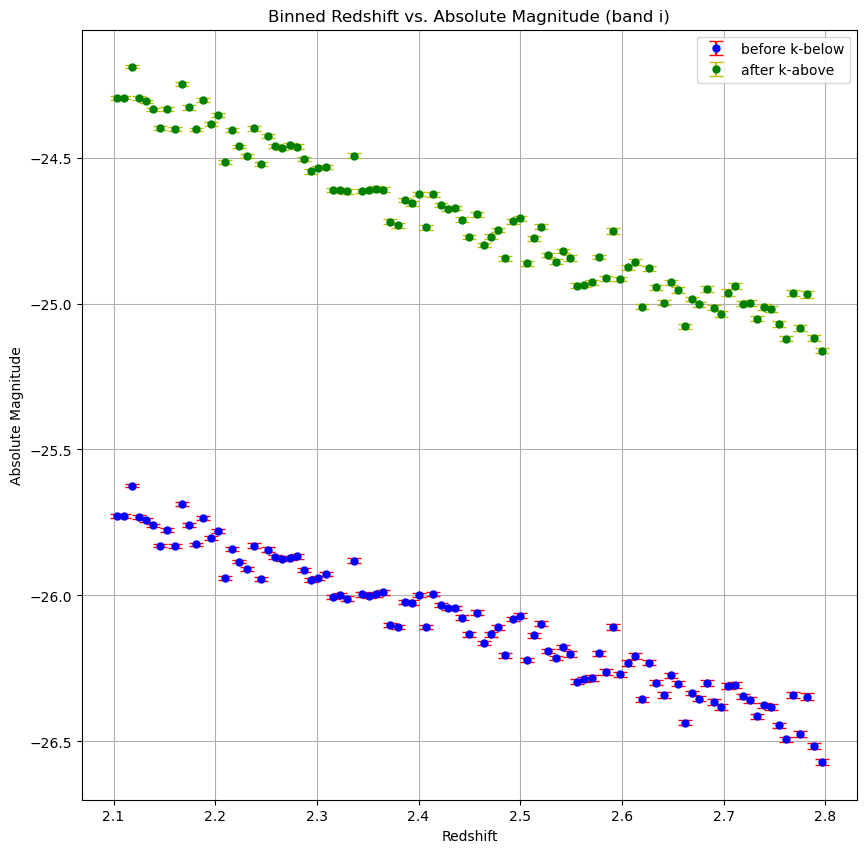

In [33]:
plt.figure(figsize=(10, 10))
plt.errorbar(bin_centers_i_bk, binned_magnitudes_i_bk, yerr=binned_errors_i_bk, fmt='o', color='b', ecolor='r', capsize=5, markersize=5,label='before k-below')
plt.errorbar(bin_centers_i_ak, binned_magnitudes_i_ak, yerr=binned_errors_i_ak, fmt='o', color='g', ecolor='y', capsize=5, markersize=5,label='after k-above')
plt.xlabel('Redshift')
plt.ylabel('Absolute Magnitude')
plt.legend()
plt.grid(True)
plt.title('Binned Redshift vs. Absolute Magnitude (band i)')
plt.savefig('/global/u1/z/zhaozhon/k-correction/plot/i1', dpi=300)
plt.show

<function matplotlib.pyplot.show(close=None, block=None)>

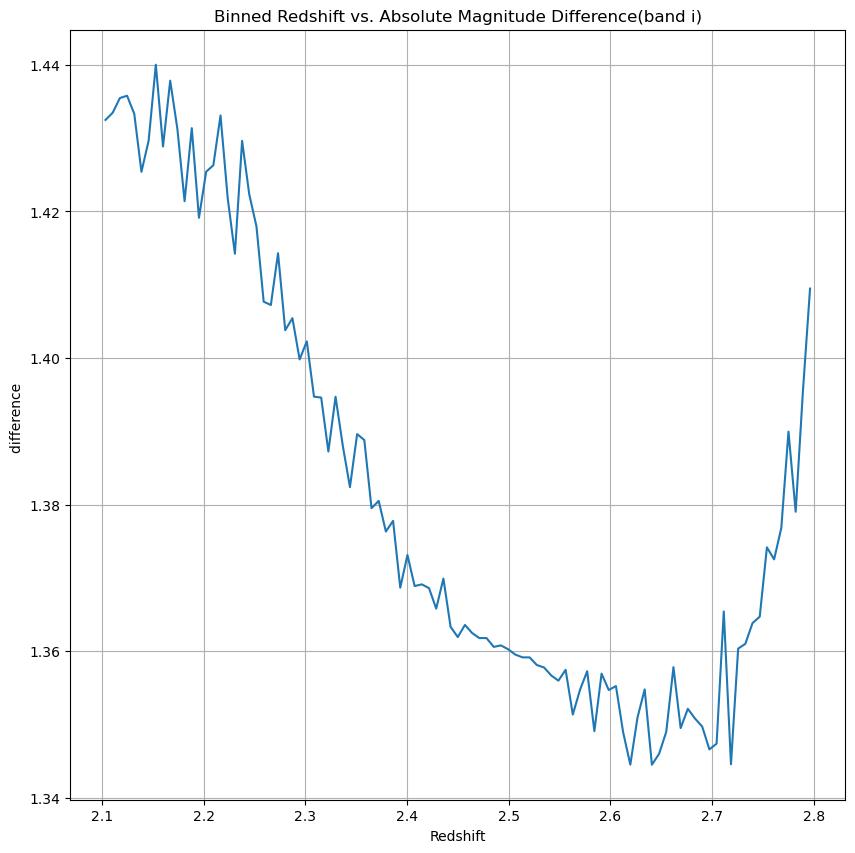

In [34]:
plt.figure(figsize=(10, 10))
plt.plot(bin_centers_i_bk,np.array(binned_magnitudes_i_ak)-np.array(binned_magnitudes_i_bk))
plt.xlabel('Redshift')
plt.ylabel('difference ')
plt.grid(True)
plt.title('Binned Redshift vs. Absolute Magnitude Difference(band i)')
plt.savefig('/global/u1/z/zhaozhon/k-correction/plot/i2', dpi=300)
plt.show